In [19]:
from platform import python_version

print(python_version())



3.6.10


In [2]:
import numpy as np
import pandas as pd
import sys
import scanpy as sc
import anndata as ann
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import logging
import os
from plotnine import *
import plotnine

sc.settings.verbosity = 3
sc.logging.print_version_and_date()
results_file = '/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis'

Running Scanpy 1.6.0, on 2021-04-19 10:22.


In [3]:
directory = os.getcwd()
directory

'/mnt/ibm_lg/ashleyb/Jupyter_Notebooks/Jupyter_notebooks'

In [351]:
cd /mnt/ibm_lg/ashleyb/COVID19_Data/COMET/5_Prime_Data/CD45

/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/5_Prime_Data/CD45


In [16]:
ls

 adata_clustering_annotated_merge.h5ad
 Artik_Data_Ingest_QC.ipynb
 batchglm/
 Blood_Bacterial_Infections.ipynb
 COMET_Annotation.ipynb
 COMET_Dexamethasone.ipynb
 COMET_scTracheaAsp_QC_Preprocessing.ipynb
 COMET_scTrachea_CellQuality.ipynb
 COMET_scTrachea_QCPreprocessing_BingAnnData.ipynb
 COMET_scTracheAsp_Clustering.ipynb
 data/
 DE_Analysis_LOOCV_PositivevsNegative.ipynb
 DE_Analysis_SecondaryBacterial.ipynb
 DE_Time_Series.ipynb
 Dexamethasone_FindGenes.ipynb
 Differential_Expression_Diffxpy.ipynb
 figures/
 GT_Data_Ingest_QC_Cluster.ipynb
 Longitudinal.ipynb
'Longitudinal Trajectory.ipynb'
 Parnasus_scTrachea_PreProcessing.ipynb
 SCIRPY_Tcell.ipynb
 scVelo.ipynb
 Secondary_Bacterial_Ingest_QC_Clustering.ipynb
 Secondary_Bacterial.ipynb
 Secondary_Bacterial_Subcluster.ipynb
 Subclustering_Data.ipynb
'Tabla Sapiens_Annotation.ipynb'
 Tabula_Sapiens/
 TracheaAsp_FindMarkerGenes.ipynb
 Transplant_Data_Ingest_QC.ipynb
 Untitled.ipynb
 Viral_Enrichment.ipynb
 Viral_Patients.ipynb
 Vir

# Ingest Artik's data

In [6]:
Ingest_Samples=['COMET_1001_CD45_Day0','COMET_1002_CD45_Day0','COMET_1072_CD45_Day4','COMET_1089_CD45_Day1','COMET_1107_CD45_Day0','COMET_1145_CD45_Day2','COMET_1325_CD45_Day0','COMET_1360_CD45_Day0','COMET_1366_CD45_Day0','COMET_1373_CD45_Day2','COMET_1376_CD45_Day0','COMET_1400_CD45_Day1']

In [7]:
#get all directories containing matrix,barcodes and features for anndata and sample names
path_list=[]
directory_name=[]
path='/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/5_Prime_Data/CD45'
for root,d_names,f_names in os.walk(path):
    for sample in Ingest_Samples:
        if root.endswith('filtered_feature_bc_matrix'):
            sample_id=root.split('/')[8]
            if sample==sample_id:
                path_list.append(root)
                name=root.split('/')[8]
                directory_name.append(name)
        

In [8]:
path_list

['/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/5_Prime_Data/CD45/COMET_1089_CD45_Day1/filtered_feature_bc_matrix',
 '/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/5_Prime_Data/CD45/COMET_1002_CD45_Day0/filtered_feature_bc_matrix',
 '/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/5_Prime_Data/CD45/COMET_1107_CD45_Day0/filtered_feature_bc_matrix',
 '/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/5_Prime_Data/CD45/COMET_1072_CD45_Day4/filtered_feature_bc_matrix',
 '/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/5_Prime_Data/CD45/COMET_1376_CD45_Day0/filtered_feature_bc_matrix',
 '/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/5_Prime_Data/CD45/COMET_1373_CD45_Day2/filtered_feature_bc_matrix',
 '/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/5_Prime_Data/CD45/COMET_1400_CD45_Day1/filtered_feature_bc_matrix',
 '/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/5_Prime_Data/CD45/COMET_1325_CD45_Day0/filtered_feature_bc_matrix',
 '/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/5_Prime_Data/CD45/COMET_1366_CD45_Day0/filtered_feature_bc_matrix',
 '/mnt/ibm_lg/ashle

In [9]:
len(path_list)

12

In [10]:
directory_name

['COMET_1089_CD45_Day1',
 'COMET_1002_CD45_Day0',
 'COMET_1107_CD45_Day0',
 'COMET_1072_CD45_Day4',
 'COMET_1376_CD45_Day0',
 'COMET_1373_CD45_Day2',
 'COMET_1400_CD45_Day1',
 'COMET_1325_CD45_Day0',
 'COMET_1366_CD45_Day0',
 'COMET_1360_CD45_Day0',
 'COMET_1001_CD45_Day0',
 'COMET_1145_CD45_Day2']

In [11]:
len(directory_name)

12

In [12]:
adatas=[sc.read_10x_mtx(path) for path in path_list]

--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.


/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading fr

In [13]:
adatas[0].shape

(1583, 33549)

In [14]:
len(adatas)

12

In [15]:
#add Identity and day of 
patient_list=[]
day_list=[]
for item in directory_name:
    day=item.split('_')[3]
    patient=item.split('_')[1]
    patient_list.append(patient)
    day_list.append(day)

for i in range(len(adatas)):
    adatas[i].obs['Identity'] = directory_name[i]
    adatas[i].obs['Patient']=patient_list[i]
    adatas[i].obs['Day']=day_list[i]


In [16]:
adatas[10].obs

,Identity,Patient,Day
AAACCTGCAGAGCCAA-1,COMET_1001_CD45_Day0,1001,Day0
AAACCTGCATGCCCGA-1,COMET_1001_CD45_Day0,1001,Day0
AAACCTGTCCAAACAC-1,COMET_1001_CD45_Day0,1001,Day0
AAACGGGAGCTAGGCA-1,COMET_1001_CD45_Day0,1001,Day0
AAACGGGTCCGTAGTA-1,COMET_1001_CD45_Day0,1001,Day0
...,...,...,...
TTTCCTCTCATGTCCC-1,COMET_1001_CD45_Day0,1001,Day0
TTTGCGCGTTACGGAG-1,COMET_1001_CD45_Day0,1001,Day0
TTTGCGCTCCACGTGG-1,COMET_1001_CD45_Day0,1001,Day0
TTTGGTTAGAAGGGTA-1,COMET_1001_CD45_Day0,1001,Day0


In [17]:
for i in range(len(adatas)):
    sc.pp.calculate_qc_metrics(adatas[i], inplace=True)

In [18]:
#get percent mitochondrial and ribosomal genes for each adata object
for i in range(len(adatas)):
    mt_gene_mask = np.flatnonzero([gene.startswith('MT-') for gene in adatas[i].var_names])
    adatas[i].obs['mt_frac'] = np.sum(adatas[i][:, mt_gene_mask].X, axis=1).A1/adatas[i].obs['total_counts']
    mito_genes = adatas[i].var_names.str.startswith('MT-')
    adatas[i].obs['percent_mito'] = np.sum(adatas[i][:, mito_genes].X, axis=1).A1 / np.sum(adatas[i].X, axis=1).A1
    ribo_genes = adatas[i].var_names.str.startswith(('RPS','RPL'))
    adatas[i].obs['percent_ribo'] = np.sum(adatas[i][:, ribo_genes].X, axis=1).A1 / np.sum(adatas[i].X, axis=1).A1
    sars_genes = adatas[i].var_names.str.startswith('SARS2')
    adatas[i].obs['percent_SARS'] = np.sum(adatas[i][:, sars_genes].X, axis=1).A1 / np.sum(adatas[i].X, axis=1).A1
# the `.A1` is only necessary as X is sparse (to transform to a dense array after summing)

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


In [19]:
adata_merge=adatas[0].concatenate(adatas[1:])

In [20]:
adata_merge.obs

,Identity,Patient,Day,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,mt_frac,percent_mito,percent_ribo,percent_SARS,batch
AAACCTGTCACTTATC-1-0,COMET_1089_CD45_Day1,1089,Day1,687,6.533789,1808.0,7.500529,47.787611,59.181416,71.902655,89.657080,0.067478,0.067478,0.018805,0.000553,0
AAACGGGAGAGGTTGC-1-0,COMET_1089_CD45_Day1,1089,Day1,3272,8.093462,12587.0,9.440499,31.627870,40.978788,51.727973,66.449511,0.080798,0.080798,0.102884,0.000000,0
AAACGGGAGTGGTCCC-1-0,COMET_1089_CD45_Day1,1089,Day1,418,6.037871,752.0,6.624065,46.143617,57.712766,71.010638,100.000000,0.005319,0.005319,0.047872,0.067819,0
AAACGGGGTCTCCCTA-1-0,COMET_1089_CD45_Day1,1089,Day1,1713,7.446585,5457.0,8.604837,38.519333,52.831226,63.734653,76.745465,0.045629,0.045629,0.374198,0.000183,0
AAACGGGGTGGCTCCA-1-0,COMET_1089_CD45_Day1,1089,Day1,397,5.986452,735.0,6.601230,45.578231,59.591837,73.197279,100.000000,0.021769,0.021769,0.044898,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAAGGAGTTTA-1-11,COMET_1145_CD45_Day2,1145,Day2,294,5.686975,943.0,6.850126,68.610817,79.215270,90.031813,100.000000,0.010604,0.010604,0.004242,0.000000,11
TTTGTCACAATCACAC-1-11,COMET_1145_CD45_Day2,1145,Day2,265,5.583496,707.0,6.562444,64.497878,76.661952,90.806223,100.000000,0.011315,0.011315,0.005658,0.000000,11
TTTGTCACAGTTTACG-1-11,COMET_1145_CD45_Day2,1145,Day2,197,5.288267,687.0,6.533789,76.710335,85.880640,100.000000,100.000000,0.001456,0.001456,0.008734,0.000000,11
TTTGTCAGTTCTGAAC-1-11,COMET_1145_CD45_Day2,1145,Day2,523,6.261492,1772.0,7.480428,59.142212,69.413093,81.320542,98.702032,0.006772,0.006772,0.003950,0.000000,11


In [21]:
set(adata_merge.obs['Patient'])

{'1001',
 '1002',
 '1072',
 '1089',
 '1107',
 '1145',
 '1325',
 '1360',
 '1366',
 '1373',
 '1376',
 '1400'}

In [22]:
#Add metadata for Artik
status_dict={'1001':'Yes','1002':'Yes','1072':'Yes','1089':'Yes','1107':'Yes','1145':'Yes','1325':'No','1360':'No','1366':'No','1373':'No','1376':'No','1400':'No'}

In [23]:
adata_merge.obs['COVID']=[status_dict.get(x) for x in adata_merge.obs['Patient']]

In [24]:
adata_merge.obs

,Identity,Patient,Day,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,mt_frac,percent_mito,percent_ribo,percent_SARS,batch,COVID
AAACCTGTCACTTATC-1-0,COMET_1089_CD45_Day1,1089,Day1,687,6.533789,1808.0,7.500529,47.787611,59.181416,71.902655,89.657080,0.067478,0.067478,0.018805,0.000553,0,Yes
AAACGGGAGAGGTTGC-1-0,COMET_1089_CD45_Day1,1089,Day1,3272,8.093462,12587.0,9.440499,31.627870,40.978788,51.727973,66.449511,0.080798,0.080798,0.102884,0.000000,0,Yes
AAACGGGAGTGGTCCC-1-0,COMET_1089_CD45_Day1,1089,Day1,418,6.037871,752.0,6.624065,46.143617,57.712766,71.010638,100.000000,0.005319,0.005319,0.047872,0.067819,0,Yes
AAACGGGGTCTCCCTA-1-0,COMET_1089_CD45_Day1,1089,Day1,1713,7.446585,5457.0,8.604837,38.519333,52.831226,63.734653,76.745465,0.045629,0.045629,0.374198,0.000183,0,Yes
AAACGGGGTGGCTCCA-1-0,COMET_1089_CD45_Day1,1089,Day1,397,5.986452,735.0,6.601230,45.578231,59.591837,73.197279,100.000000,0.021769,0.021769,0.044898,0.000000,0,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAAGGAGTTTA-1-11,COMET_1145_CD45_Day2,1145,Day2,294,5.686975,943.0,6.850126,68.610817,79.215270,90.031813,100.000000,0.010604,0.010604,0.004242,0.000000,11,Yes
TTTGTCACAATCACAC-1-11,COMET_1145_CD45_Day2,1145,Day2,265,5.583496,707.0,6.562444,64.497878,76.661952,90.806223,100.000000,0.011315,0.011315,0.005658,0.000000,11,Yes
TTTGTCACAGTTTACG-1-11,COMET_1145_CD45_Day2,1145,Day2,197,5.288267,687.0,6.533789,76.710335,85.880640,100.000000,100.000000,0.001456,0.001456,0.008734,0.000000,11,Yes
TTTGTCAGTTCTGAAC-1-11,COMET_1145_CD45_Day2,1145,Day2,523,6.261492,1772.0,7.480428,59.142212,69.413093,81.320542,98.702032,0.006772,0.006772,0.003950,0.000000,11,Yes


In [25]:
adata_merge.shape

(20896, 33549)

In [26]:
Cell_Number_BeforeQC_Artik = adata_merge.obs.groupby(['Identity']).size()
Cell_Number_QC_Artik = pd.DataFrame(Cell_Number_BeforeQC_Artik)
#number of cells from each sample

In [27]:
Cell_Number_QC_Artik

,0
Identity,
COMET_1001_CD45_Day0,1288
COMET_1002_CD45_Day0,2614
COMET_1072_CD45_Day4,1200
COMET_1089_CD45_Day1,1583
COMET_1107_CD45_Day0,3116
COMET_1145_CD45_Day2,1997
COMET_1325_CD45_Day0,1252
COMET_1360_CD45_Day0,1404
COMET_1366_CD45_Day0,742


In [28]:
adata_merge.layers['raw_counts']=adata_merge.X

In [29]:
adata_merge.layers['raw_counts'][100:110,100:110].todense()

matrix([[0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 4., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
        [0., 2., 2., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
        [1., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 1., 0., 0., 0., 0., 0., 0., 0.]], dtype=float32)

In [30]:
adata_merge.shape

(20896, 33549)

In [45]:
adata_merge.write_h5ad('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Artik_data/Artik_AnnData_041221_Raw_All.h5ad')

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
... storing 'COVID' as categorical


In [31]:
adata_pos = adata_merge[adata_merge.obs['COVID']=='Yes']

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


In [32]:
adata_pos.write_h5ad('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Artik_data/Artik_AnnData_041221_Raw_Pos.h5ad')

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1210: ImplicitModificationWarning: Initializing view as actual.
Trying to set attribute `.obs` of view, copying.
... storing 'Identity' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Patient' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'Day' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'COVID' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'feature_types' as categorical


In [33]:
adata_pos

AnnData object with n_obs × n_vars = 11798 × 33549
    obs: 'Identity', 'Patient', 'Day', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'percent_mito', 'percent_ribo', 'percent_SARS', 'batch', 'COVID'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'n_cells_by_counts-10', 'mean_counts-10', 'log1p_mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'log1p_total_counts-10', 'n_cells_by_counts-11', 'mean_counts-11', 'log1p_mean_counts-11', 'pct_dropout_by_counts-11', 'total_counts-11', 'log1p_total_counts-11', 'n_cells_by_counts-2', 'mean_counts-2', 'log1p_

In [34]:
adata_pos.shape

(11798, 33549)

In [35]:
adata_pos.obs

,Identity,Patient,Day,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,mt_frac,percent_mito,percent_ribo,percent_SARS,batch,COVID
AAACCTGTCACTTATC-1-0,COMET_1089_CD45_Day1,1089,Day1,687,6.533789,1808.0,7.500529,47.787611,59.181416,71.902655,89.657080,0.067478,0.067478,0.018805,0.000553,0,Yes
AAACGGGAGAGGTTGC-1-0,COMET_1089_CD45_Day1,1089,Day1,3272,8.093462,12587.0,9.440499,31.627870,40.978788,51.727973,66.449511,0.080798,0.080798,0.102884,0.000000,0,Yes
AAACGGGAGTGGTCCC-1-0,COMET_1089_CD45_Day1,1089,Day1,418,6.037871,752.0,6.624065,46.143617,57.712766,71.010638,100.000000,0.005319,0.005319,0.047872,0.067819,0,Yes
AAACGGGGTCTCCCTA-1-0,COMET_1089_CD45_Day1,1089,Day1,1713,7.446585,5457.0,8.604837,38.519333,52.831226,63.734653,76.745465,0.045629,0.045629,0.374198,0.000183,0,Yes
AAACGGGGTGGCTCCA-1-0,COMET_1089_CD45_Day1,1089,Day1,397,5.986452,735.0,6.601230,45.578231,59.591837,73.197279,100.000000,0.021769,0.021769,0.044898,0.000000,0,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAAGGAGTTTA-1-11,COMET_1145_CD45_Day2,1145,Day2,294,5.686975,943.0,6.850126,68.610817,79.215270,90.031813,100.000000,0.010604,0.010604,0.004242,0.000000,11,Yes
TTTGTCACAATCACAC-1-11,COMET_1145_CD45_Day2,1145,Day2,265,5.583496,707.0,6.562444,64.497878,76.661952,90.806223,100.000000,0.011315,0.011315,0.005658,0.000000,11,Yes
TTTGTCACAGTTTACG-1-11,COMET_1145_CD45_Day2,1145,Day2,197,5.288267,687.0,6.533789,76.710335,85.880640,100.000000,100.000000,0.001456,0.001456,0.008734,0.000000,11,Yes
TTTGTCAGTTCTGAAC-1-11,COMET_1145_CD45_Day2,1145,Day2,523,6.261492,1772.0,7.480428,59.142212,69.413093,81.320542,98.702032,0.006772,0.006772,0.003950,0.000000,11,Yes


# QC Preprocessing

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


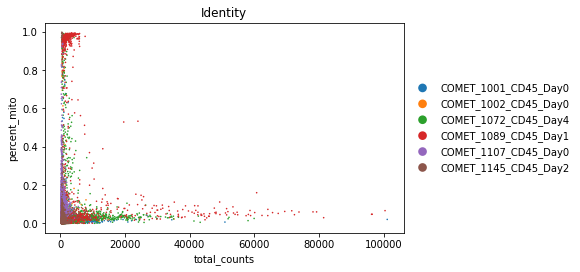

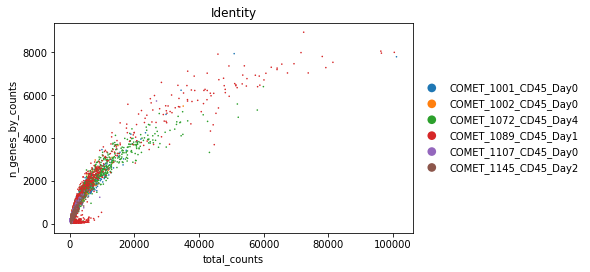

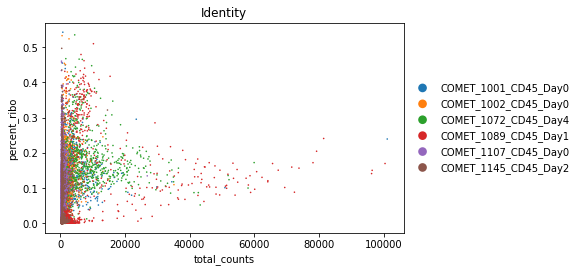

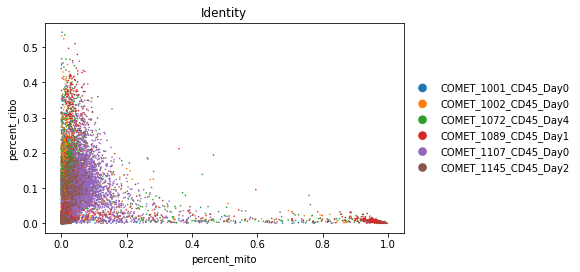

In [36]:
sc.pl.scatter(adata_pos, x='total_counts', y='percent_mito', color="Identity")
sc.pl.scatter(adata_pos, x='total_counts', y='n_genes_by_counts', color="Identity")
sc.pl.scatter(adata_pos, x='total_counts', y='percent_ribo', color="Identity")
sc.pl.scatter(adata_pos, x='percent_mito', y='percent_ribo', color="Identity")

... storing 'Identity' as categorical
... storing 'Patient' as categorical
... storing 'Day' as categorical
... storing 'COVID' as categorical
... storing 'feature_types' as categorical


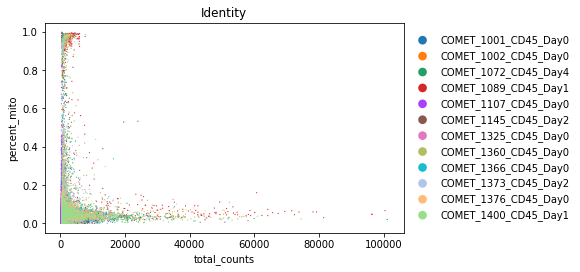

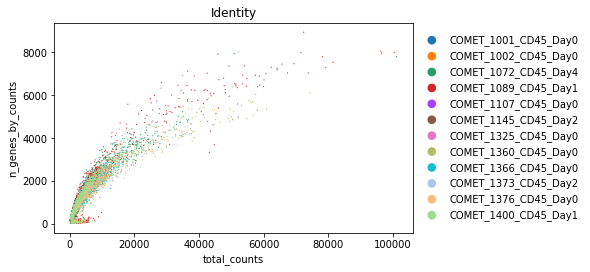

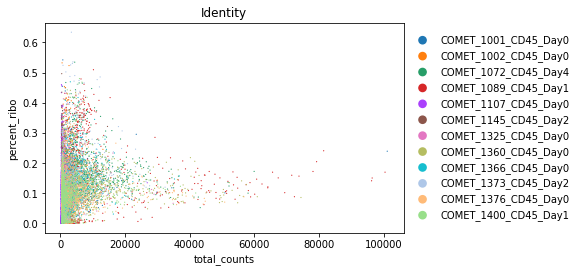

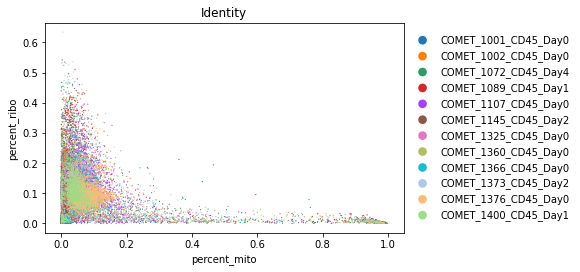

In [37]:
sc.pl.scatter(adata_merge, x='total_counts', y='percent_mito', color="Identity")
sc.pl.scatter(adata_merge, x='total_counts', y='n_genes_by_counts', color="Identity")
sc.pl.scatter(adata_merge, x='total_counts', y='percent_ribo', color="Identity")
sc.pl.scatter(adata_merge, x='percent_mito', y='percent_ribo', color="Identity")

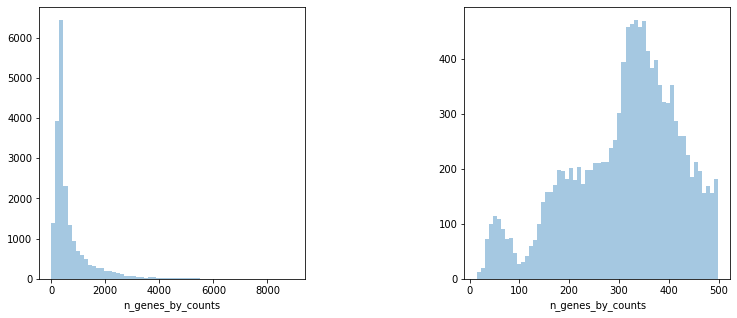

In [61]:
#Thresholding decision: genes for all samples individually in adatas

rcParams['figure.figsize']=(20,5)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6) #create a grid for subplots

p4 = sb.distplot(adata_merge.obs['n_genes_by_counts'], kde=False, bins=60, ax=fig.add_subplot(fig_ind[0]))

p5 = sb.distplot(adata_merge.obs['n_genes_by_counts'][adata_merge.obs['n_genes_by_counts']<500], 
                     kde=False, bins=60, ax=fig.add_subplot(fig_ind[1]))
plt.show()

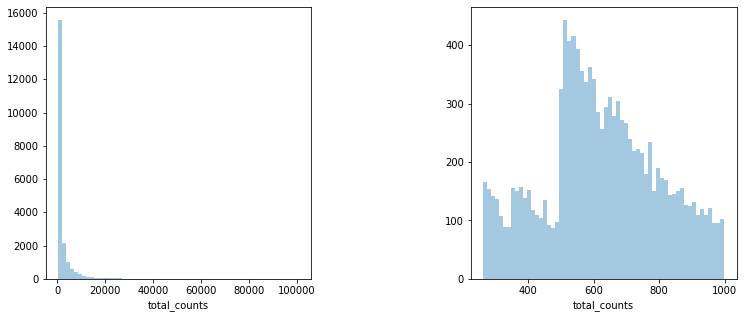

In [62]:
#Thresholding decision: genes for all samples individually in adatas

rcParams['figure.figsize']=(20,5)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6) #create a grid for subplots

p4 = sb.distplot(adata_merge.obs['total_counts'], kde=False, bins=60, ax=fig.add_subplot(fig_ind[0]))

p5 = sb.distplot(adata_merge.obs['total_counts'][adata_merge.obs['total_counts']<1000], 
                     kde=False, bins=60, ax=fig.add_subplot(fig_ind[1]))
plt.show()

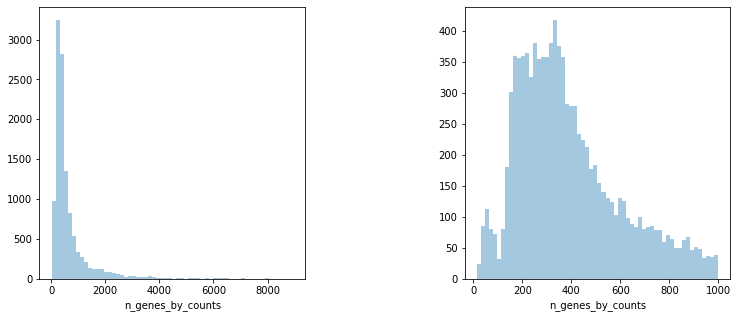

In [67]:
#Thresholding decision: genes for all samples individually in adatas

rcParams['figure.figsize']=(20,5)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6) #create a grid for subplots

p4 = sb.distplot(adata_pos.obs['n_genes_by_counts'], kde=False, bins=60, ax=fig.add_subplot(fig_ind[0]))

p5 = sb.distplot(adata_pos.obs['n_genes_by_counts'][adata_pos.obs['n_genes_by_counts']<1000], 
                     kde=False, bins=60, ax=fig.add_subplot(fig_ind[1]))
plt.show()

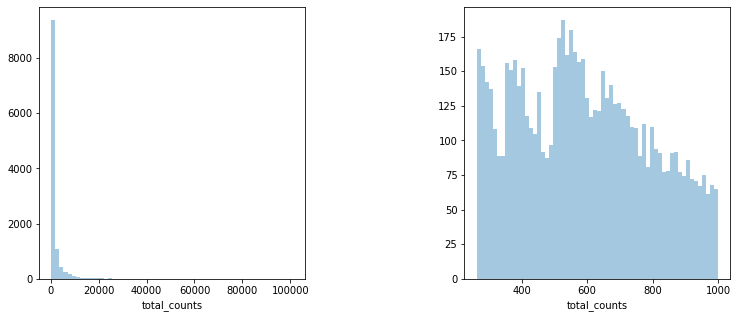

In [64]:
#Thresholding decision: genes for all samples individually in adatas

rcParams['figure.figsize']=(20,5)
fig_ind=np.arange(131, 133)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6) #create a grid for subplots

p4 = sb.distplot(adata_pos.obs['total_counts'], kde=False, bins=60, ax=fig.add_subplot(fig_ind[0]))

p5 = sb.distplot(adata_pos.obs['total_counts'][adata_pos.obs['total_counts']<1000], 
                     kde=False, bins=60, ax=fig.add_subplot(fig_ind[1]))
plt.show()

In [35]:
percents_sars_df = adata_merge.obs[["Identity","percent_SARS","percent_mito","percent_ribo"]]

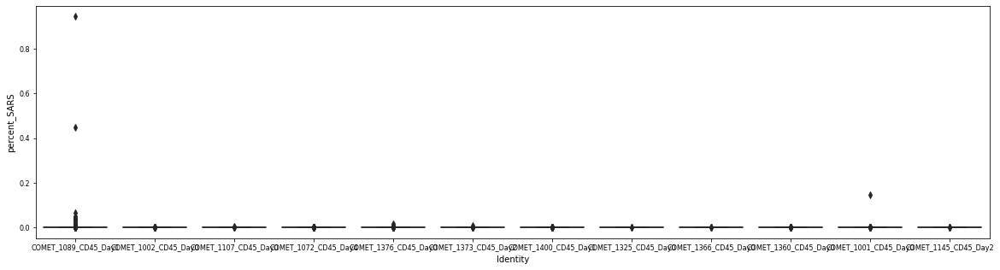

In [36]:
ax = sb.boxplot(x="Identity", y="percent_SARS", data=percents_sars_df, color=".25")
ax.tick_params(labelsize=8)

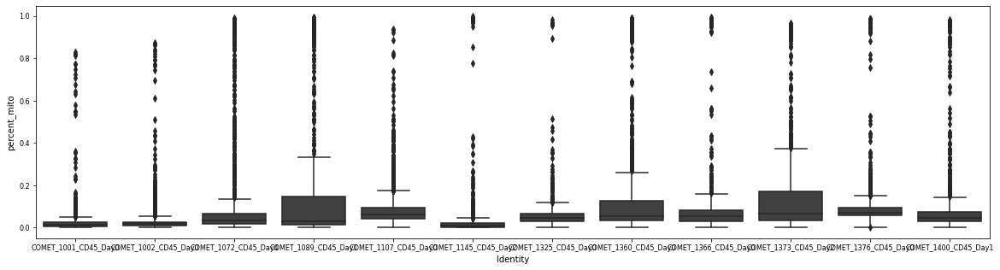

In [30]:
ax = sb.boxplot(x="Identity", y="percent_mito", data=percents_sars_df, color=".25")
ax.tick_params(labelsize=8)

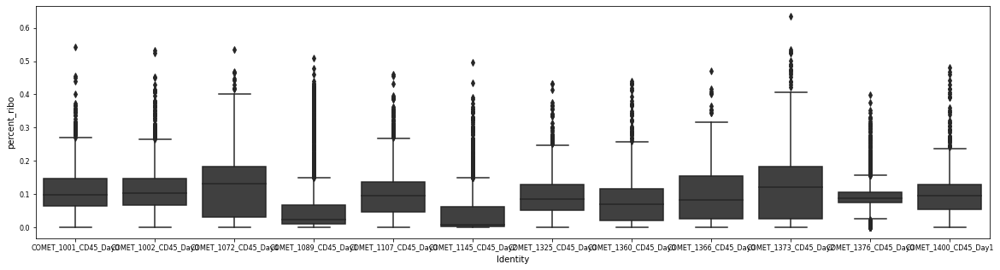

In [31]:
ax = sb.boxplot(x="Identity", y="percent_ribo", data=percents_sars_df, color=".25")
ax.tick_params(labelsize=8)

In [38]:
adata_merge.shape

(20896, 33549)

In [39]:
sc.pp.filter_cells(adata_merge, max_counts = 30000)
print('Number of cells after max count filter: {:d}'.format(adata_merge.n_obs))

sc.pp.filter_cells(adata_merge, min_counts=500)
print('Number of cells after min count filter: {:d}'.format(adata_merge.n_obs))

# No need to do ribosomal

sc.pp.filter_cells(adata_merge, min_genes = 300)
print('Number of cells after gene filter: {:d}'.format(adata_merge.n_obs))

adata_merge = adata_merge[adata_merge.obs['percent_mito'] < 0.5]
print('Number of cells after MT filter: {:d}'.format(adata_merge.n_obs))




filtered out 178 cells that have more than 30000 counts


/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


Number of cells after max count filter: 20718
filtered out 2409 cells that have less than 500 counts
Number of cells after min count filter: 18309
filtered out 2535 cells that have less than 300 genes expressed
Number of cells after gene filter: 15774
Number of cells after MT filter: 15720


/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


In [40]:
sc.pp.filter_cells(adata_pos, max_counts = 30000)
print('Number of cells after max count filter: {:d}'.format(adata_pos.n_obs))

sc.pp.filter_cells(adata_pos, min_counts=500)
print('Number of cells after min count filter: {:d}'.format(adata_pos.n_obs))

# No need to do ribosomal

sc.pp.filter_cells(adata_pos, min_genes = 300)
print('Number of cells after gene filter: {:d}'.format(adata_pos.n_obs))

adata_pos = adata_pos[adata_pos.obs['percent_mito'] < 0.5]
print('Number of cells after MT filter: {:d}'.format(adata_pos.n_obs))


filtered out 98 cells that have more than 30000 counts
Number of cells after max count filter: 11700
filtered out 2409 cells that have less than 500 counts
Number of cells after min count filter: 9291
filtered out 1636 cells that have less than 300 genes expressed
Number of cells after gene filter: 7655
Number of cells after MT filter: 7620


/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


In [41]:
adata_merge.shape

(15720, 33549)

In [42]:
adata_pos.shape

(7620, 33549)

In [43]:
Cell_Number_AfterQC = adata_merge.obs.groupby(['Identity']).size()
Cell_Number_QC = pd.DataFrame(Cell_Number_AfterQC)
#number of cells from each sample

In [44]:
Cell_Number_QC

,0
Identity,
COMET_1001_CD45_Day0,1139
COMET_1002_CD45_Day0,2375
COMET_1072_CD45_Day4,1006
COMET_1089_CD45_Day1,1101
COMET_1107_CD45_Day0,1406
COMET_1145_CD45_Day2,593
COMET_1325_CD45_Day0,1128
COMET_1360_CD45_Day0,1066
COMET_1366_CD45_Day0,624


In [45]:
Cell_Number_AfterQC_Pos = adata_pos.obs.groupby(['Identity']).size()
Cell_Number_pos = pd.DataFrame(Cell_Number_AfterQC_Pos)

In [46]:
Cell_Number_pos

,0
Identity,
COMET_1001_CD45_Day0,1139
COMET_1002_CD45_Day0,2375
COMET_1072_CD45_Day4,1006
COMET_1089_CD45_Day1,1101
COMET_1107_CD45_Day0,1406
COMET_1145_CD45_Day2,593


In [47]:
sc.pp.filter_genes(adata_merge, min_cells=3)

filtered out 13824 genes that are detected in less than 3 cells


Trying to set attribute `.var` of view, copying.
/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


In [48]:
sc.pp.filter_genes(adata_pos, min_cells=3)

filtered out 15339 genes that are detected in less than 3 cells


Trying to set attribute `.var` of view, copying.
/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


In [49]:
#Normalize Reads Per 10,000 and Log(X+1)
sc.pp.normalize_total(adata_merge, target_sum=1e4)
sc.pp.log1p(adata_merge)
sc.pp.normalize_total(adata_pos, target_sum=1e4)
sc.pp.log1p(adata_pos)

normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)


In [50]:
#Set the .raw attribute of AnnData object to the normalized and logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object.
adata_merge.raw = adata_merge
adata_pos.raw = adata_pos

In [51]:
adata_merge.layers['raw_counts'][100:110,100:110].todense()

matrix([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]], dtype=float32)

In [52]:
adata_merge

AnnData object with n_obs × n_vars = 15720 × 19725
    obs: 'Identity', 'Patient', 'Day', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'percent_mito', 'percent_ribo', 'percent_SARS', 'batch', 'COVID', 'n_counts', 'n_genes'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'n_cells_by_counts-10', 'mean_counts-10', 'log1p_mean_counts-10', 'pct_dropout_by_counts-10', 'total_counts-10', 'log1p_total_counts-10', 'n_cells_by_counts-11', 'mean_counts-11', 'log1p_mean_counts-11', 'pct_dropout_by_counts-11', 'total_counts-11', 'log1p_total_counts-11', 'n_cells_by_counts-2', '

In [46]:
adata_merge.obs['n_genes']

AAACCTGTCACTTATC-1-0      687
AAACGGGAGAGGTTGC-1-0     3272
AAACGGGAGTGGTCCC-1-0      418
AAACGGGGTCTCCCTA-1-0     1713
AAACGGGGTGGCTCCA-1-0      397
                         ... 
TTTGGTTAGTTGAGTA-1-11     264
TTTGGTTCAGATCTGT-1-11     267
TTTGTCAAGGAGTTTA-1-11     294
TTTGTCACAATCACAC-1-11     265
TTTGTCAGTTCTGAAC-1-11     523
Name: n_genes, Length: 17151, dtype: int64

In [47]:
adata_merge.obs['total_counts']

AAACCTGTCACTTATC-1-0      1808.0
AAACGGGAGAGGTTGC-1-0     12587.0
AAACGGGAGTGGTCCC-1-0       752.0
AAACGGGGTCTCCCTA-1-0      5457.0
AAACGGGGTGGCTCCA-1-0       735.0
                          ...   
TTTGGTTAGTTGAGTA-1-11      771.0
TTTGGTTCAGATCTGT-1-11      749.0
TTTGTCAAGGAGTTTA-1-11      943.0
TTTGTCACAATCACAC-1-11      707.0
TTTGTCAGTTCTGAAC-1-11     1772.0
Name: total_counts, Length: 17151, dtype: float32

In [53]:
sc.pp.highly_variable_genes(adata_merge, min_mean=0.0125, max_mean=10, min_disp=0.5)
sc.pp.highly_variable_genes(adata_pos, min_mean=0.0125, max_mean=10, min_disp=0.5)

extracting highly variable genes
    finished (0:00:04)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


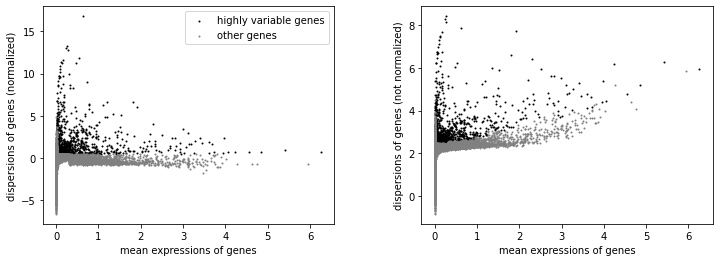

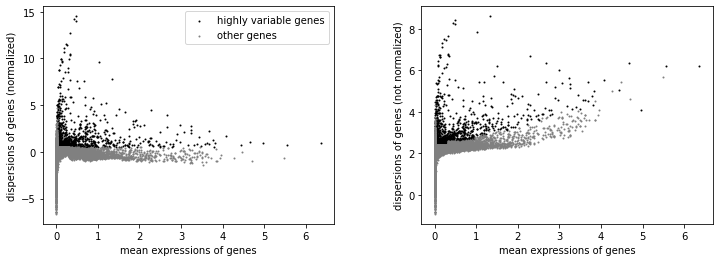

In [54]:
sc.pl.highly_variable_genes(adata_merge)
sc.pl.highly_variable_genes(adata_pos)

#Note that .raw must have been saved as the normalized and logarithmized raw gene expression before the "regressing out" and "scaling" operations.


In [55]:
sc.pp.regress_out(adata_merge, ['total_counts','percent_mito'],n_jobs=16)
sc.pp.regress_out(adata_pos,['total_counts','percent_mito'],n_jobs=16)
#this takes a long time

regressing out ['total_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use


/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


    finished (0:05:49)
regressing out ['total_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:03:06)


In [56]:
#Center data with a max value of 10 for counts
sc.pp.scale(adata_merge, max_value=10)
sc.pp.scale(adata_pos, max_value=10)

In [57]:
adata_merge.write_h5ad('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Artik_AnnData_041221_LogNorm_QCFiltered.h5ad')

In [58]:
adata_pos.write_h5ad('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Artik_AnnData_041221_Pos_LogNorm_QCFiltered.h5ad')

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


In [59]:
#Calculate Principle Component
sc.tl.pca(adata_merge, svd_solver='arpack',n_comps=60)
sc.tl.pca(adata_pos, svd_solver='arpack', n_comps=60)

computing PCA
    on highly variable genes


/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


    with n_comps=60
    finished (0:00:31)
computing PCA
    on highly variable genes
    with n_comps=60


/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


    finished (0:00:08)


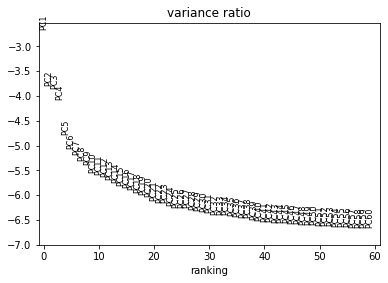

In [60]:
sc.pl.pca_variance_ratio(adata_merge, log=True,n_pcs=60)

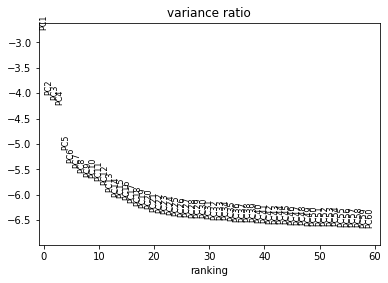

In [61]:
sc.pl.pca_variance_ratio(adata_pos, log=True,n_pcs=60)

# Batch Correction with Harmony

In [62]:
import scanpy.external as sce 

In [63]:
sce.pp.harmony_integrate(adata_merge, 'Identity')
sce.pp.harmony_integrate(adata_pos, 'Identity')

2021-04-12 18:01:26,588 - harmonypy - INFO - Iteration 1 of 10
2021-04-12 18:01:32,993 - harmonypy - INFO - Iteration 2 of 10
2021-04-12 18:01:40,565 - harmonypy - INFO - Iteration 3 of 10
2021-04-12 18:01:47,730 - harmonypy - INFO - Converged after 3 iterations
2021-04-12 18:01:48,858 - harmonypy - INFO - Iteration 1 of 10
2021-04-12 18:01:51,430 - harmonypy - INFO - Iteration 2 of 10
2021-04-12 18:01:53,691 - harmonypy - INFO - Iteration 3 of 10
2021-04-12 18:01:55,677 - harmonypy - INFO - Iteration 4 of 10
2021-04-12 18:01:57,338 - harmonypy - INFO - Converged after 4 iterations


In [64]:
'X_pca_harmony' in adata_merge.obsm
'X_pca_harmony' in adata_pos.obsm

True

In [65]:
adata_merge.obsm['X_pca'] = adata_merge.obsm['X_pca_harmony']
adata_pos.obsm['X_pca'] = adata_pos.obsm['X_pca_harmony']

In [66]:
sc.pp.neighbors(adata_merge, n_neighbors=20, n_pcs=60)
sc.pp.neighbors(adata_pos, n_neighbors=20, n_pcs=60)

computing neighbors
    using 'X_pca' with n_pcs = 60
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:16)
computing neighbors
    using 'X_pca' with n_pcs = 60
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:16)


In [67]:
sc.tl.tsne(adata_merge, n_jobs=20)
sc.tl.umap(adata_merge)
sc.tl.draw_graph(adata_merge, n_jobs=20)


computing tSNE
    using 'X_pca' with n_pcs = 60
    using the 'MulticoreTSNE' package by Ulyanov (2017)
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:39)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:15)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:02:24)
computing tSNE
    using 'X_pca' with n_pcs = 60
    using the 'MulticoreTSNE' package by Ulyanov (2017)
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm) (0:00:17)


NameError: name 'st' is not defined

In [68]:
sc.tl.umap(adata_pos)
sc.tl.tsne(adata_pos, n_jobs=20)
sc.tl.draw_graph(adata_pos, n_jobs=20)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:18)


/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


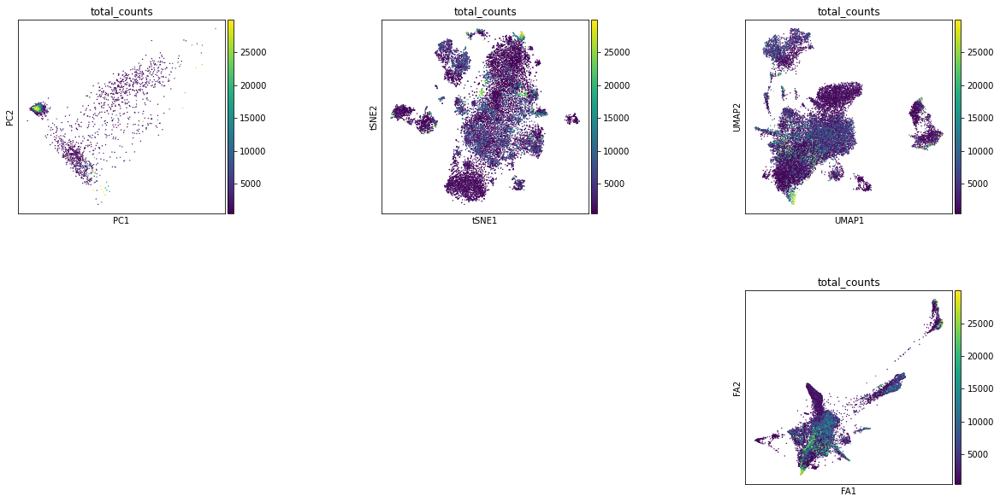

In [69]:
rcParams['figure.figsize']=(20,10)
fig_ind=np.arange(231, 237)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

p10 = sc.pl.pca_scatter(adata_merge, color='total_counts', ax=fig.add_subplot(fig_ind[0]), show=False)
p11 = sc.pl.tsne(adata_merge, color='total_counts', ax=fig.add_subplot(fig_ind[1]), show=False)
p12 = sc.pl.umap(adata_merge, color='total_counts', ax=fig.add_subplot(fig_ind[2]), show=False)
#p13 = sc.pl.diffmap(adata_merge, color='total_counts', components=['1,2'], ax=fig.add_subplot(fig_ind[3]),show=False)
p13 = sc.pl.draw_graph(adata_merge, color='total_counts', ax=fig.add_subplot(fig_ind[5]), show=False)

plt.show()


KeyError: 'draw_graph'

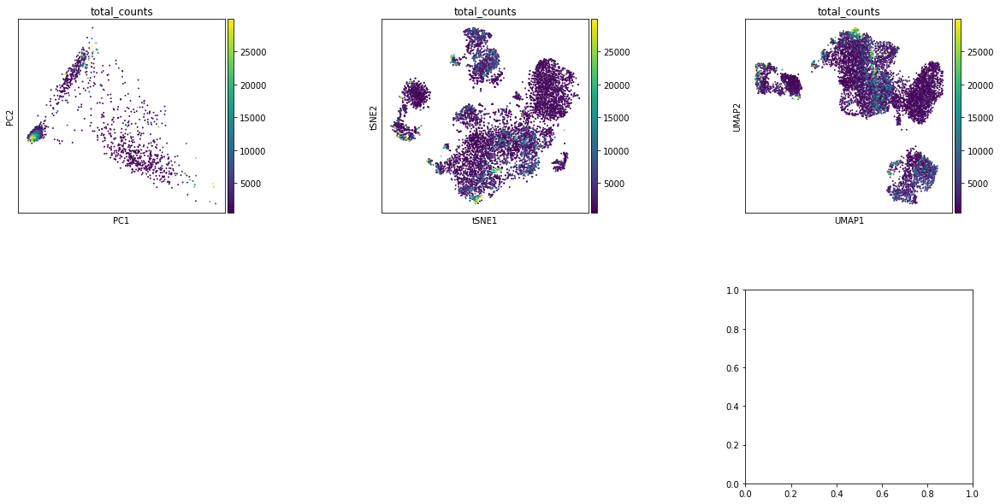

In [70]:
rcParams['figure.figsize']=(20,10)
fig_ind=np.arange(231, 237)
fig = plt.figure()
fig.subplots_adjust(hspace=0.4, wspace=0.6)

p10 = sc.pl.pca_scatter(adata_pos, color='total_counts', ax=fig.add_subplot(fig_ind[0]), show=False)
p11 = sc.pl.tsne(adata_pos, color='total_counts', ax=fig.add_subplot(fig_ind[1]), show=False)
p12 = sc.pl.umap(adata_pos, color='total_counts', ax=fig.add_subplot(fig_ind[2]), show=False)
#p13 = sc.pl.diffmap(adata_merge, color='total_counts', components=['1,2'], ax=fig.add_subplot(fig_ind[3]),show=False)
p13 = sc.pl.draw_graph(adata_pos, color='total_counts', ax=fig.add_subplot(fig_ind[5]), show=False)

plt.show()


/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


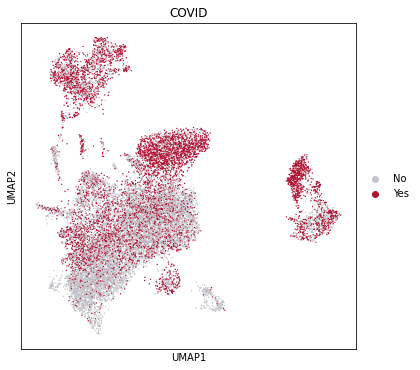

In [360]:
rcParams['figure.figsize']=6,6
sc.pl.umap(adata_merge, color='COVID', palette=['#c2c5cc','#b01030'], save='Artik_UMAP_COVIDvControl.pdf')

In [262]:
sc.tl.embedding_density(adata_merge, groupby='COVID', basis='umap')

computing density on 'umap'


/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


--> added
    'umap_density_COVID', densities (adata.obs)
    'umap_density_COVID_params', parameter (adata.uns)


/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
/home/ashleyb/.local/lib/python3.6/site-packages/scanpy/plotting/_tools/__init__.py:1156: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("viridis"))
/home/ashleyb/.local/lib/python3.6/site-packages/scanpy/plotting/_tools/__init__.py:1157: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("viridis"))
/home/ashleyb/.local/lib/python3.6/site-packa

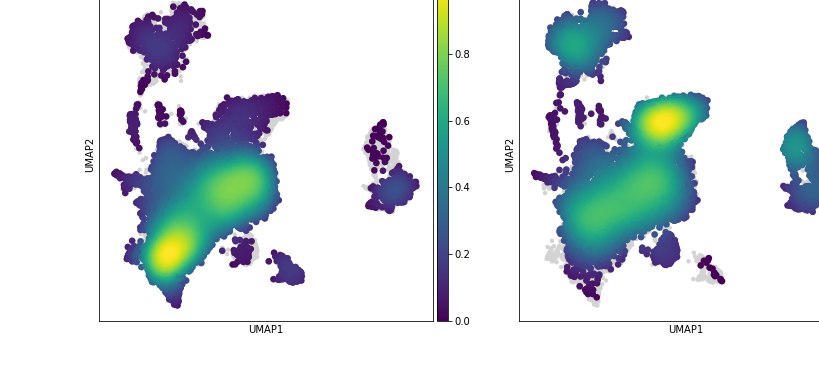

In [288]:
sc.pl.embedding_density(adata_merge, key='umap_density_COVID', color_map='viridis', save='Artik_EmbeddingDensity_COVID.pdf')

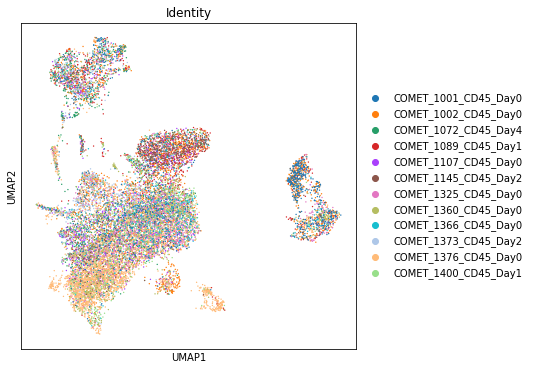

In [72]:
rcParams['figure.figsize']=6,6
sc.pl.umap(adata_merge, color='Identity')

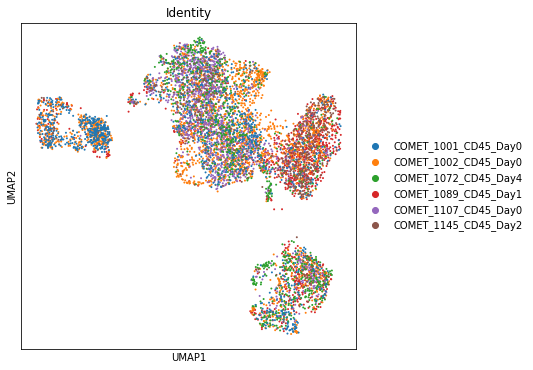

In [73]:
rcParams['figure.figsize']=6,6
sc.pl.umap(adata_pos, color='Identity')

In [74]:
# Perform clustering - using highly variable genes using Leiden Clustering
sc.tl.leiden(adata_merge, key_added='leiden_r1')
sc.tl.leiden(adata_merge, resolution=0.5, key_added='leiden_r0.5')


running Leiden clustering
    finished: found 17 clusters and added
    'leiden_r1', the cluster labels (adata.obs, categorical) (0:00:04)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden_r0.5', the cluster labels (adata.obs, categorical) (0:00:05)


In [75]:
pd.crosstab(adata_merge.obs['leiden_r1'], adata_merge.obs['leiden_r0.5'])

leiden_r0.5,0,1,2,3,4,5,6,7,8,9,10,11,12,13
leiden_r1,,,,,,,,,,,,,,
0,3,3028,0,0,0,0,0,0,0,0,0,0,0,0
1,2741,0,2,0,2,0,0,0,0,0,0,0,0,0
2,23,0,1968,0,0,0,0,0,0,0,0,0,0,0
3,1606,259,0,2,2,11,0,0,0,0,0,0,0,0
4,0,1,0,1527,0,0,0,0,0,0,0,0,0,0
5,52,84,0,0,908,0,0,0,0,0,0,0,0,0
6,36,36,1,0,1,792,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,655,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,589,0,0,0,0,0,0


In [77]:
# Perform clustering - using highly variable genes using Leiden Clustering
sc.tl.leiden(adata_pos, key_added='leiden_r1')
sc.tl.leiden(adata_pos, resolution=0.5, key_added='leiden_r0.5')


running Leiden clustering
    finished: found 14 clusters and added
    'leiden_r1', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_r0.5', the cluster labels (adata.obs, categorical) (0:00:03)


/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


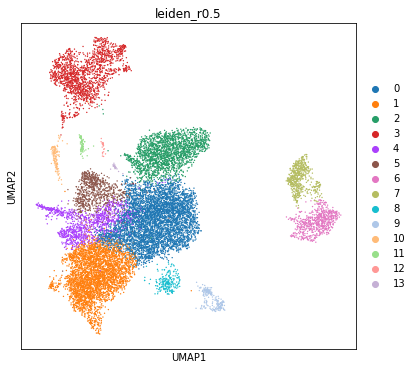

In [78]:
rcParams['figure.figsize']=6,6
sc.pl.umap(adata_merge, color='leiden_r0.5')

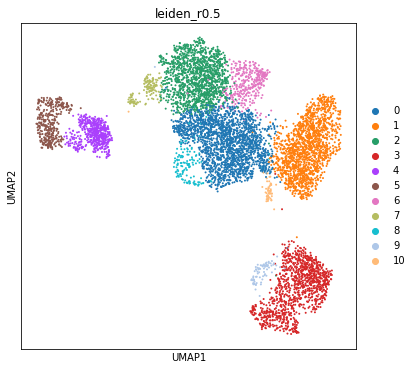

In [79]:
rcParams['figure.figsize']=6,6
sc.pl.umap(adata_pos, color='leiden_r0.5')

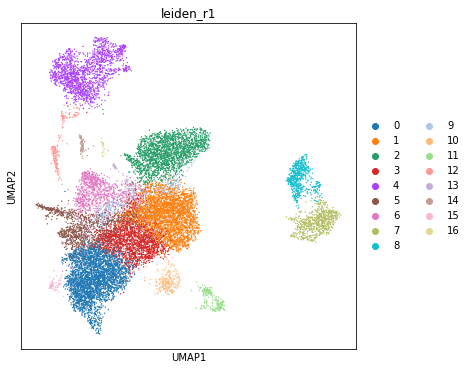

In [80]:
rcParams['figure.figsize']=6,6
sc.pl.umap(adata_merge, color='leiden_r1')

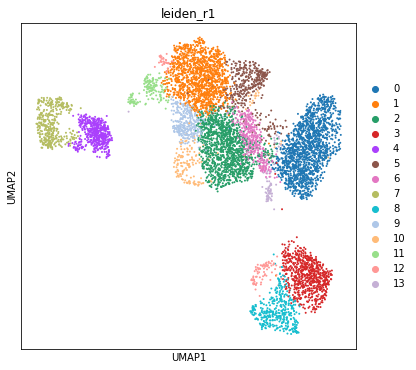

In [81]:
rcParams['figure.figsize']=6,6
sc.pl.umap(adata_pos, color='leiden_r1')

In [84]:
BALF_marker_genes=['CD79A','MS4A1','KRT19','TPPP3','SLPI','GPNMB','MSR1','S100A9','TPSAB1','CPA3','NKG7','KLRD1','NAMPT','IFITM2','JCHAIN','MZB1','IL32','CD3E','LGALS2','CST7','CD7','TSPAN13','CD1C','HLA-DQA2','PKIB']

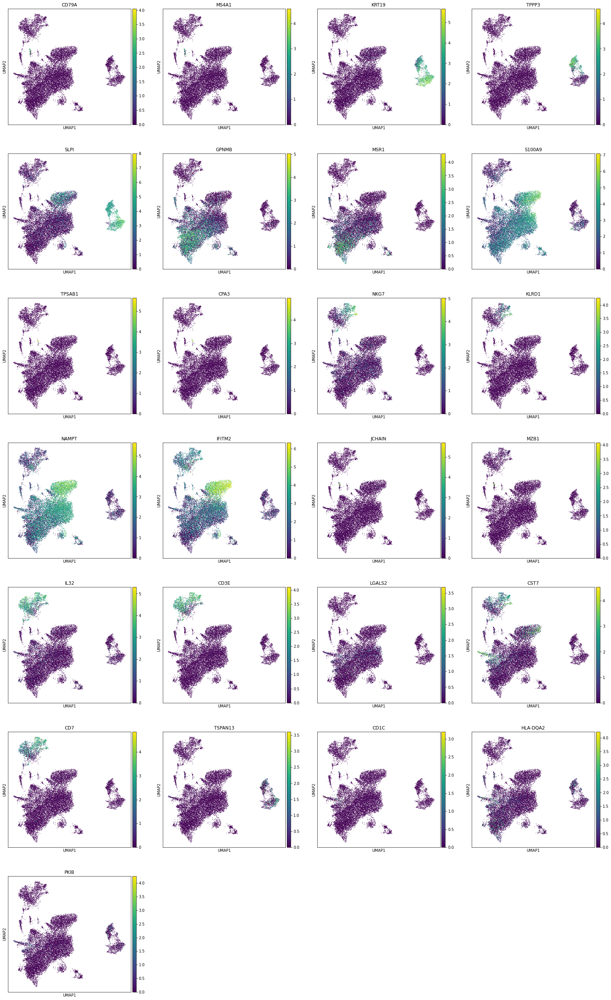

In [85]:
rcParams['figure.figsize']=6,6
sc.pl.umap(adata_merge, color=BALF_marker_genes)

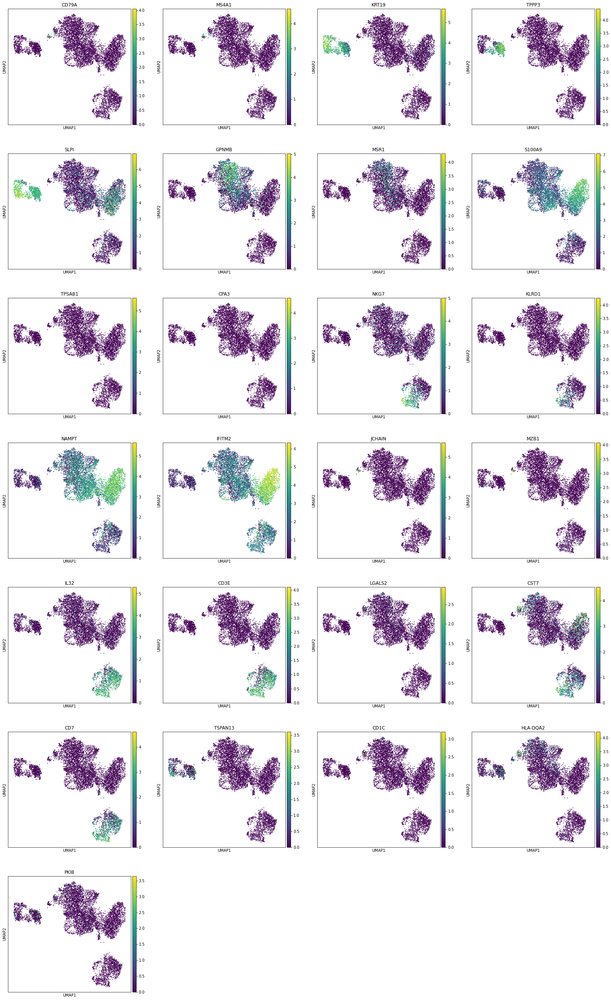

In [86]:
rcParams['figure.figsize']=6,6
sc.pl.umap(adata_pos, color=BALF_marker_genes)

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


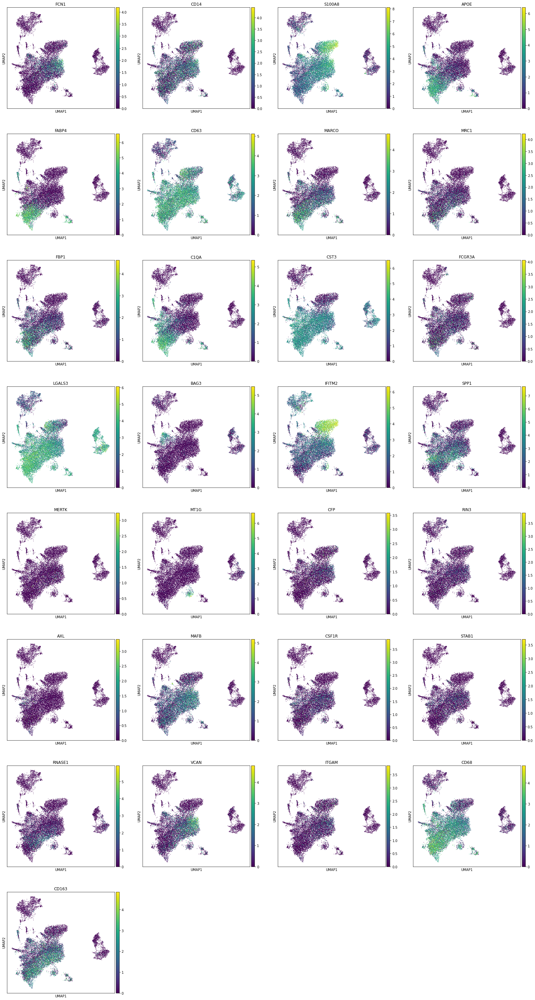

In [135]:
rcParams['figure.figsize']=6,6
sc.pl.umap(adata_merge, color=['FCN1','CD14','S100A8','APOE','FABP4','CD63','MARCO','MRC1','FBP1','C1QA','CST3','FCGR3A','LGALS3','BAG3','IFITM2','SPP1','MERTK','MT1G','CFP','RIN3','AXL','MAFB','CSF1R','STAB1','RNASE1','VCAN','ITGAM','CD68','CD163'])

In [255]:
T_cell_genes =['CD8A', 'CD8B','CD4','CD3E','CD2','FOXP3','MKI67','IFNG','GNLY','NKG7','RORA','TBX21','LEF1','CCR7','DUSP2','LDHB']

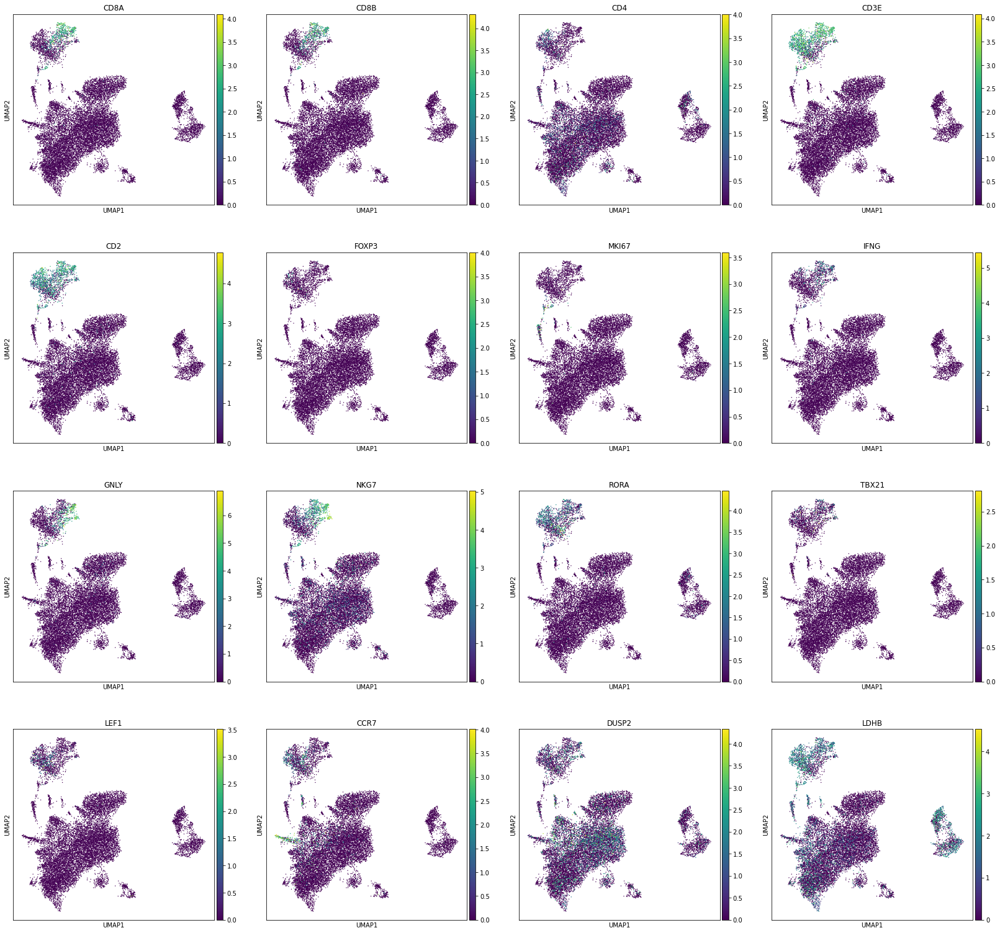

In [256]:
sc.pl.umap(adata_merge, color=T_cell_genes)

In [90]:
#Calculate marker genes with Leiden resolution 1.0
sc.tl.rank_genes_groups(adata_merge, groupby='leiden_r1', key_added='rank_genes_r1',method='wilcoxon', corr_method='benjamini-hochberg')

ranking genes
    finished: added to `.uns['rank_genes_r1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:29)


In [91]:
#Calculate marker genes with Leiden resolution 1.0
sc.tl.rank_genes_groups(adata_pos, groupby='leiden_r1', key_added='rank_genes_r1',method='wilcoxon', corr_method='benjamini-hochberg')

ranking genes
    finished: added to `.uns['rank_genes_r1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:13)


In [92]:
adata_merge_cluster_genes = pd.DataFrame(adata_merge.uns['rank_genes_r1']['names'])
adata_merge_cluster_genes.iloc[:60]


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,APOC1,TIMP1,IFITM2,CTSB,IL32,CD74,HSPA1A,KRT19,WFDC2,GBP1,MT1G,HBB,STMN1,HIST2H2AA4,MEF2C,FABP4,HDC
1,FTL,IL1B,NAMPT,SH3BGRL3,CD3E,HLA-DRA,HSP90AA1,WFDC2,PRDX5,CXCL10,MT2A,HBA2,H2AFZ,HIST1H2AC,RPS23,APOC1,CPA3
2,C1QB,EREG,NEAT1,CCL2,RPS15A,HLA-DPA1,HSPB1,SLPI,GSTP1,IFITM3,MT1X,HBA1,HMGN2,HIST2H2AA3,RPS4X,FTL,HPGD
3,APOE,CXCL2,BCL2A1,CTSL,CD2,HLA-DRB1,DNAJB1,GSTP1,TSPAN1,MX1,MT1F,FABP4,TUBA1B,HIST1H1C,RPL18,CCL22,TPSB2
4,C1QC,CXCL8,SOD2,FTL,RPS3,HLA-DPB1,HSPH1,LCN2,C20orf85,ISG15,MT1H,CRIP1,HIST1H4C,JUND,RPS15A,C1QB,GATA2
5,FABP4,CXCL3,S100A8,CSTB,CD3D,HLA-DQA1,HSPA1B,AGR2,SLPI,IFIT3,AIF1,APOC1,HMGB1,BTG1,RPS18,CD74,IL1RL1
6,FABP5,CCL3,CXCL8,FABP5,SARAF,HLA-DQB1,HSPA6,KRT18,CAPS,RNF213,S100A8,MT-ND2,HIST1H1E,FOSB,HLA-DQA1,CRIP1,NSMCE1
7,CD74,CD44,H3F3B,ATP5F1E,PTPRCAP,GPR183,HSPE1,SERPINB3,LCN2,GBP5,ATP5F1E,MT-CO1,TUBB,CD44,CD79A,C1QA,MS4A2
8,C1QA,ATP2B1-AS1,G0S2,VIM,RPL11,HLA-DRB5,HSPD1,KRT8,DYNLL1,LAP3,CCL4L2,MT-ND4,PTMA,NEAT1,RPS5,FABP5,TPSAB1
9,HLA-DRB1,PLAUR,IFITM1,FTH1,CD7,CST3,BAG3,S100A6,C9orf24,IFIT2,CCL4,FTL,HMGB2,GADD45B,RPS6,HLA-DRA,PTGS1


In [151]:
adata_pos_cluster_genes = pd.DataFrame(adata_pos.uns['rank_genes_r1']['names'])
adata_pos_cluster_genes.iloc[:60]

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,IFITM2,C1QB,CCL2,IL32,PRDX5,HSPA1A,EREG,KRT19,CCL5,FTL,MT1G,HLA-DRA,STMN1,MT-CO1
1,NAMPT,HLA-DRA,CTSL,RPS15A,WFDC2,HSP90AA1,CXCL2,WFDC2,NKG7,SH3BGRL3,MT2A,HLA-DPA1,HMGB1,MT-ND4
2,BCL2A1,FTL,TIMP1,CD3E,GSTP1,HSPH1,MALAT1,LCN2,GZMB,TMSB10,MT1H,CD74,PTMA,MT-CO2
3,S100A9,C1QC,VIM,SARAF,TSPAN1,HSPB1,AC245014.3,SLPI,IL32,RPL39,MT1F,HLA-DPB1,TUBB,MT-ND2
4,SRGN,APOC1,CTSB,RPS3,C20orf85,DNAJB1,CD83,KRT18,GZMA,SERF2,MT1X,HLA-DRB1,HMGN2,MT-ND3
5,IFITM3,HLA-DRB1,S100A10,RPL28,CAPS,HSPA1B,PLAUR,AGR2,CD7,RPL12,AIF1,HLA-DQA1,H2AFZ,MT-CYB
6,SOD2,CD74,SH3BGRL3,IL7R,DYNLL1,HSPA6,FOSB,GSTP1,CD3D,RPS13,IFI30,HLA-DQB1,HIST1H4C,MT-ATP6
7,H3F3B,HLA-DPA1,ANXA5,RPS12,LCN2,HSPE1,ANXA5,CLDN4,CD2,VIM,ACTB,RPS23,HMGB2,MT-CO3
8,S100A8,CTSB,CCL3,RPS21,SLPI,HSPD1,ZEB2,TACSTD2,CD3E,CSTB,S100A8,RPL10,TUBA1B,MT-ATP8
9,G0S2,GPNMB,CXCL3,RPL11,C9orf24,HSP90AB1,SGK1,KRT8,PRF1,FTH1,CCL4,RPS19,ANP32B,MT-ND5


In [213]:
AT2_markers=['WIF1','HHIP','CA2','SERPINA1']
np.in1d(AT2_markers, adata_merge.var_names)

array([False, False,  True,  True])

In [396]:
marker_genes_dict = {'B-cell': ['CD79A', 'CD19','BANK1','LIMD2'],
                     'Plasma':['JCHAIN','MZB1'],
                     'pDC':['TSPAN13','MAP1A','LILRA4'],
                     'mDC':['LGALS2','PKIB','CD1C','HLA-DQA2','CLEC9A','AHR'],
                     'T-cell': ['CD3D','CD3E','LCK',"IL32",'CD2','PTPRCAP','CD7','IL32','TRAC'],
                     'T-CD8+': ['CD8A', 'CD8B'],
                     'T-CD4+': ['CD4','GATA3','FOXP3','IL17A','IFNG'],
                     'NK': ['GNLY', 'NKG7','KLRD1'],
                     #'Myeloid': ['CST3', 'LYZ','AREG', 'MPHOSPH6', 'HBEGF'],
                     'Mono/Macro': ['CD68','MERTK','LGALS3','CD163','FABP4','COL6A3','SPP1','GPNMB','MSR1','BAG3','FABP5','FTL','CYP27A1'],
                     'Monocytes':['FCN1','CD14','FCGR3A','CSF3R','S100A8','OLR1'],
                     'MoAM':['MAFB','ITGAM','VCAN','RNASE1','STAB1','CCL2','CCL8','CSF1R'],
                     'Alveolar_Macrophage':['MARCO','MRC1','APOE','APOC1','FBP1','C1QA'],
                     'AT2':['WIF1','HHIP','CA2','SERPINA1','SFTPA','SFTPA2','SFTPC','ETV5','AQP5','CP','GSTA1','CYP4B1'],
                     'Neutrophil':['FCGR3B','CXCR2','PROK2','S100A8','SRGN','NAMPT','IFITM2','MXD1'],
                     'Dendritic': ['FCER1A','LAMP3','CD1E','EREG','TREM2','IGSF21'],
                     #'Epithelial':['KRT18','EPCAM','KRT17','KRT19','TPPP3'],
                     'Basal':['KRT5','TP63','KRT7'],                   
                     'Secretory':['SPDEF','CREB3L1','MUC5B','MUC5AC'],
                     'Ciliated':['FOXJ1','SNTN','CDHR3','TPPP3'],
                    'Mast/Basophils':['KIT','CPA3','MS4A2','FCER1A','TPSAB1','TPSB2'],
                     'Red Blood Cells':['HBB','HBA1'],
                     #'Dividig Cells':['MKI67','TUBB'],
                     #'Resident Lympohcytes':['CD69','LMNA','RGCC'],
                     'pDC':['TCF4','SPIB','IRF4','IRF8','BCL11A']
            
                    }

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


categories: 0, 1, 2, etc.
var_group_labels: B-cell, Plasma, pDC, etc.


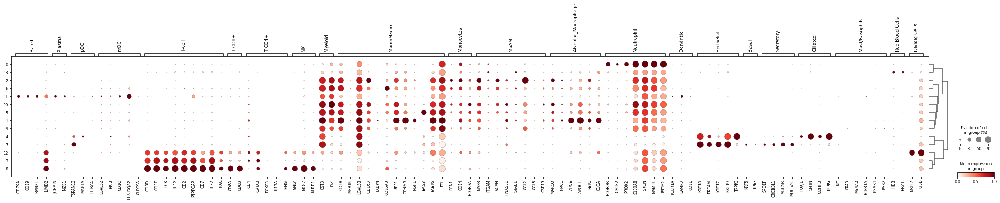

In [154]:
sc.pl.dotplot(adata_pos, marker_genes_dict, groupby='leiden_r1', dot_max=0.7, standard_scale='var', dendrogram=True)

In [397]:
sc.pl.dotplot(adata_merge, marker_genes_dict, groupby='leiden_r1',dot_max=0.7, standard_scale='var',dendrogram=True)

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


KeyError: "Values ['WIF1', 'HHIP', 'SFTPA', 'SFTPA2', 'SFTPC'], from ['CD79A', 'CD19', 'BANK1', 'LIMD2', 'JCHAIN', 'MZB1', 'TCF4', 'SPIB', 'IRF4', 'IRF8', 'BCL11A', 'LGALS2', 'PKIB', 'CD1C', 'HLA-DQA2', 'CLEC9A', 'AHR', 'CD3D', 'CD3E', 'LCK', 'IL32', 'CD2', 'PTPRCAP', 'CD7', 'IL32', 'TRAC', 'CD8A', 'CD8B', 'CD4', 'GATA3', 'FOXP3', 'IL17A', 'IFNG', 'GNLY', 'NKG7', 'KLRD1', 'CD68', 'MERTK', 'LGALS3', 'CD163', 'FABP4', 'COL6A3', 'SPP1', 'GPNMB', 'MSR1', 'BAG3', 'FABP5', 'FTL', 'CYP27A1', 'FCN1', 'CD14', 'FCGR3A', 'CSF3R', 'S100A8', 'OLR1', 'MAFB', 'ITGAM', 'VCAN', 'RNASE1', 'STAB1', 'CCL2', 'CCL8', 'CSF1R', 'MARCO', 'MRC1', 'APOE', 'APOC1', 'FBP1', 'C1QA', 'WIF1', 'HHIP', 'CA2', 'SERPINA1', 'SFTPA', 'SFTPA2', 'SFTPC', 'ETV5', 'AQP5', 'CP', 'GSTA1', 'CYP4B1', 'FCGR3B', 'CXCR2', 'PROK2', 'S100A8', 'SRGN', 'NAMPT', 'IFITM2', 'MXD1', 'FCER1A', 'LAMP3', 'CD1E', 'EREG', 'TREM2', 'IGSF21', 'KRT5', 'TP63', 'KRT7', 'SPDEF', 'CREB3L1', 'MUC5B', 'MUC5AC', 'FOXJ1', 'SNTN', 'CDHR3', 'TPPP3', 'KIT', 'CPA3', 'MS4A2', 'FCER1A', 'TPSAB1', 'TPSB2', 'HBB', 'HBA1'], are not valid obs/ var names or indices."

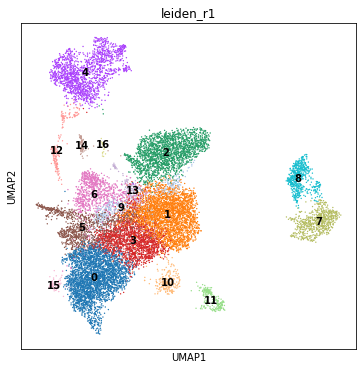

In [99]:
sc.pl.umap(adata_merge, color='leiden_r1', legend_loc='on data')

In [186]:
#My manual annnotation to Artik data based upon BALF resolution with filtering of 500 counts and min 300 genes

adata_merge.obs['annotated_ucsc'] = adata_merge.obs['leiden_r1'].cat.add_categories(['B cell/Plasma','Neutrophil','NK/T cells','Epithelial','Macrophages','Mast/Basophils','Red Blood Cells','mDC'])
adata_merge.obs['annotated_ucsc'][np.in1d(adata_merge.obs['annotated_ucsc'], ['14'])] = 'B cell/Plasma'
adata_merge.obs['annotated_ucsc'][np.in1d(adata_merge.obs['annotated_ucsc'], ['2'])] = 'Neutrophil'
adata_merge.obs['annotated_ucsc'][np.in1d(adata_merge.obs['annotated_ucsc'], ['4','12'])] = 'NK/T cells'
adata_merge.obs['annotated_ucsc'][np.in1d(adata_merge.obs['annotated_ucsc'], ['8','7'])] = 'Epithelial'
adata_merge.obs['annotated_ucsc'][np.in1d(adata_merge.obs['annotated_ucsc'], ['0','1','3','6','9','10','13','15'])] = 'Macrophages'
adata_merge.obs['annotated_ucsc'][np.in1d(adata_merge.obs['annotated_ucsc'], ['16'])] = 'Mast/Basophils'
adata_merge.obs['annotated_ucsc'][np.in1d(adata_merge.obs['annotated_ucsc'], ['11'])] = 'Red Blood Cells'
adata_merge.obs['annotated_ucsc'][np.in1d(adata_merge.obs['annotated_ucsc'], ['5'])] = 'mDC'
#adata_merge.obs['annotated_ucsc'][np.in1d(adata_merge.obs['annotated_ucsc'], ['12'])] = 'Proliferating T Cells'


adata_merge.obs['annotated_ucsc'] = adata_merge.obs['annotated_ucsc'].cat.remove_unused_categories()

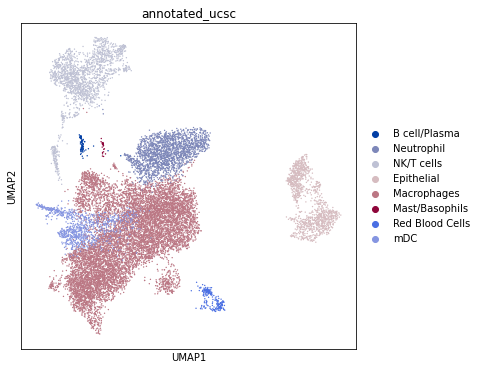

In [187]:
sc.pl.umap(adata_merge, color='annotated_ucsc')

In [182]:
#My manual annnotation with high resolution Artik data based upon BALF  with filtering of 500 counts and min 300 genes with more resolution

adata_merge.obs['annotated'] = adata_merge.obs['leiden_r1'].cat.add_categories(['B cell/Plasma','Neutrophil','NK/T cells','Cilliated','Secretory','Alveolar Macrophages','Monocytes','Macrophages','Mast/Basophils','Red Blood Cells','mDC'])
adata_merge.obs['annotated'][np.in1d(adata_merge.obs['annotated'], ['14'])] = 'B cell/Plasma'
adata_merge.obs['annotated'][np.in1d(adata_merge.obs['annotated'], ['2'])] = 'Neutrophil'
adata_merge.obs['annotated'][np.in1d(adata_merge.obs['annotated'], ['4','12'])] = 'NK/T cells'
adata_merge.obs['annotated'][np.in1d(adata_merge.obs['annotated'], ['8'])] = 'Cilliated'
adata_merge.obs['annotated'][np.in1d(adata_merge.obs['annotated'], ['7'])] = 'Secretory'
adata_merge.obs['annotated'][np.in1d(adata_merge.obs['annotated'], ['0','15'])] = 'Alveolar Macrophages'
adata_merge.obs['annotated'][np.in1d(adata_merge.obs['annotated'], ['9'])] = 'Monocytes'
adata_merge.obs['annotated'][np.in1d(adata_merge.obs['annotated'], ['1','3','6','10','13'])] = 'Macrophages'
adata_merge.obs['annotated'][np.in1d(adata_merge.obs['annotated'], ['16'])] = 'Mast/Basophils'
adata_merge.obs['annotated'][np.in1d(adata_merge.obs['annotated'], ['11'])] = 'Red Blood Cells'
adata_merge.obs['annotated'][np.in1d(adata_merge.obs['annotated'], ['5'])] = 'mDC'
#adata_merge.obs['annotated'][np.in1d(adata_merge.obs['annotated'], ['12'])] = 'Proliferating T Cells'


adata_merge.obs['annotated'] = adata_merge.obs['annotated'].cat.remove_unused_categories()

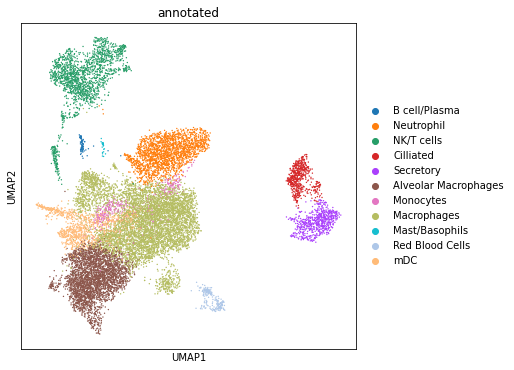

In [183]:
sc.pl.umap(adata_merge, color='annotated')

In [ ]:
color=['#6c3483','#d819d4','#c70039','#008080','#002625','#fde725ff','#0e2433','#400b0b','#ee7b06','#df488d','#f66d7a']
# purple, ? , dark pink, teal, dark green, yellow, dark blue black, orange, ?, corral pink
# Bcells, Neutrophils, Cilliated, Secretory, Alveolor, Monocytes, Mast Baso, Red blood cells, mDC
##d819d4,
# 44103c, ff0066 (pink), 445c7a (dark grey)
#'#c2c5cc','#b01030'
#want Neutrophils (dark purple), Macrohages (yellow)

In [369]:
adata_merge.uns['annotated_colors']=['#c70039','#44103c','#31688eff','#f66d7a','#002625','#111e6c','#c2c5cc','#fde725ff','#ee7b06','#ff0066','#008080']
#dark pink(RedBloodCells), dark purple(Neutrophils), teal(mDC),coral pink(Cilliated),dark green(Secretory),slate blue(Tcells),black(monocytes),yellow(macrophages)

In [344]:
adata_merge.uns['annotated_colors']=['#44103c','#445c7a','#c70039','#008080','#002625','#fde725ff','#0e2433','#d819d4','#ee7b06','#445c7a','#f66d7a']

In [363]:
adata_merge.uns['annotated_colors']

['#c70039',
 '#44103c',
 '#31688eff',
 '#f66d7a',
 '#002625',
 '#c2c5cc',
 '#0e2433',
 '#fde725ff',
 '#ee7b06',
 '#ff0066',
 '#008080']

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


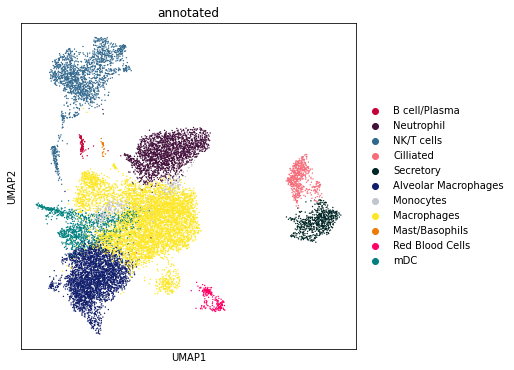

In [379]:
sc.pl.umap(adata_merge, color='annotated', save='Artik_COVID_Refined_UMAP.pdf')

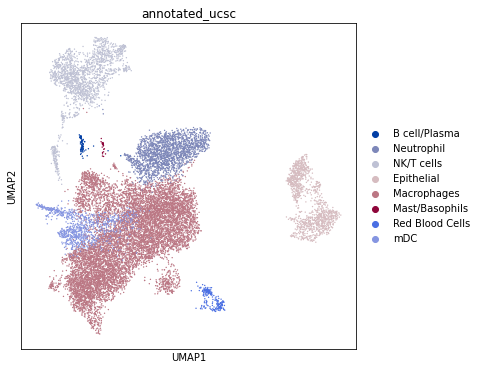

In [350]:
sc.pl.umap(adata_merge, color='annotated_ucsc')


Get Cell Proportions

In [266]:
set(adata_merge.obs['Identity'])

{'COMET_1001_CD45_Day0',
 'COMET_1002_CD45_Day0',
 'COMET_1072_CD45_Day4',
 'COMET_1089_CD45_Day1',
 'COMET_1107_CD45_Day0',
 'COMET_1145_CD45_Day2',
 'COMET_1325_CD45_Day0',
 'COMET_1360_CD45_Day0',
 'COMET_1366_CD45_Day0',
 'COMET_1373_CD45_Day2',
 'COMET_1376_CD45_Day0',
 'COMET_1400_CD45_Day1'}

In [17]:
cell_type_per_patient_refined_pos = adata_pos.obs.groupby(['annotated','Identity']).size().to_frame('count')
cell_type_refined_pos = adata_pos.obs.groupby(['Identity']).size().to_frame('count')

In [18]:
cell_type_refined_pos

,count
Identity,
COMET_1001_CD45_Day0,1139
COMET_1002_CD45_Day0,2375
COMET_1072_CD45_Day4,1006
COMET_1089_CD45_Day1,1101
COMET_1107_CD45_Day0,1406
COMET_1145_CD45_Day2,593


In [12]:
cell_type_per_patient_refined_pos.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Artik_data/Cell_Types_PosOnly_Refined.csv')

In [282]:
cell_type_per_patient_all_ucsc = adata_merge.obs.groupby(['annotated_ucsc','Identity']).size().to_frame('count')
cell_type_per_patient_all_refined = adata_merge.obs.groupby(['annotated','Identity']).size().to_frame('count')


In [286]:
cell_type_per_patient_all_ucsc.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Artik_data/Cell_Counts_per_patient_UCSC.csv')
cell_type_per_patient_all_refined.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Artik_data/Cell_Counts_per_patient_Refined.csv')

In [284]:
cell_type_per_patient_all_refined

count
annotated     Identity                   
B cell/Plasma COMET_1001_CD45_Day0      8
              COMET_1002_CD45_Day0      6
              COMET_1072_CD45_Day4      4
              COMET_1089_CD45_Day1     24
              COMET_1107_CD45_Day0      7
...                                   ...
mDC           COMET_1360_CD45_Day0    125
              COMET_1366_CD45_Day0     71
              COMET_1373_CD45_Day2     89
              COMET_1376_CD45_Day0    131
              COMET_1400_CD45_Day1     65

[132 rows x 1 columns]

In [281]:
cell_type_per_patient_all_refined

count
annotated     Identity                   
B cell/Plasma COMET_1001_CD45_Day0      8
              COMET_1002_CD45_Day0      6
              COMET_1072_CD45_Day4      4
              COMET_1089_CD45_Day1     24
              COMET_1107_CD45_Day0      7
...                                   ...
mDC           COMET_1360_CD45_Day0    125
              COMET_1366_CD45_Day0     71
              COMET_1373_CD45_Day2     89
              COMET_1376_CD45_Day0    131
              COMET_1400_CD45_Day1     65

[132 rows x 1 columns]

In [202]:
cell_type_counts=adata_merge.obs.groupby(['annotated_ucsc']).size().to_frame('count')
cell_type_counts_pos=adata_pos.obs.groupby(['annotated_ucsc']).size().to_frame('count')
cell_type_counts_resolution=adata_merge.obs.groupby(['annotated']).size().to_frame('count')
cell_type_counts_resolution_pos=adata_pos.obs.groupby(['annotated']).size().to_frame('count')

In [204]:
cell_type_counts, cell_type_counts_resolution

(                 count
 annotated_ucsc        
 B cell/Plasma       78
 Neutrophil        1991
 NK/T cells        1733
 Epithelial        1244
 Macrophages       9394
 Mast/Basophils      25
 Red Blood Cells    211
 mDC               1044,
                       count
 annotated                  
 B cell/Plasma            78
 Neutrophil             1991
 NK/T cells             1733
 Cilliated               589
 Secretory               655
 Alveolar Macrophages   3093
 Monocytes               389
 Macrophages            5912
 Mast/Basophils           25
 Red Blood Cells         211
 mDC                    1044)

In [205]:
cell_type_counts_pos.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Artik_data/Cell_Counts_PosOnly_UCSC.csv')
cell_type_counts.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Artik_data/Cell_Counts_All_UCSC.csv')
cell_type_counts_resolution.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Artik_data/Cell_Counts_All.csv')
cell_type_counts_resolution_pos.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Artik_data/Cell_Counts_Pos.csv')

In [200]:
adata_merge.write_h5ad('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Artik_AnnData_041221_All_BatchCorr_Annotated.h5ad')

In [201]:
adata_pos.write_h5ad('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Artik_AnnData_041221_Pos_BatchCorr_Annotated.h5ad')

In [20]:
#read in saved object
adata_pos = sc.read_h5ad('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Artik_AnnData_041221_Pos_BatchCorr_Annotated.h5ad')

In [21]:
adata_pos.obs

,Identity,Patient,Day,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,...,percent_ribo,percent_SARS,batch,COVID,n_counts,n_genes,leiden_r1,leiden_r0.5,annotated_ucsc,annotated
AAACCTGTCACTTATC-1-0,COMET_1089_CD45_Day1,1089,Day1,687,6.533789,1808.0,7.500529,47.787611,59.181416,71.902655,...,0.018805,0.000553,0,Yes,1808.0,687,0,1,Neutrophil,Neutrophil
AAACGGGAGAGGTTGC-1-0,COMET_1089_CD45_Day1,1089,Day1,3272,8.093462,12587.0,9.440499,31.627870,40.978788,51.727973,...,0.102884,0.000000,0,Yes,12587.0,3272,7,5,Epithelial,Secretory
AAACGGGAGTGGTCCC-1-0,COMET_1089_CD45_Day1,1089,Day1,418,6.037871,752.0,6.624065,46.143617,57.712766,71.010638,...,0.047872,0.067819,0,Yes,752.0,418,0,1,Neutrophil,Neutrophil
AAACGGGGTCTCCCTA-1-0,COMET_1089_CD45_Day1,1089,Day1,1713,7.446585,5457.0,8.604837,38.519333,52.831226,63.734653,...,0.374198,0.000183,0,Yes,5457.0,1713,3,3,NK/T cells,CD4 T cells
AAACGGGGTGGCTCCA-1-0,COMET_1089_CD45_Day1,1089,Day1,397,5.986452,735.0,6.601230,45.578231,59.591837,73.197279,...,0.044898,0.000000,0,Yes,735.0,397,2,0,Macrophages,Monocytes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTACTGGTACGACCC-1-11,COMET_1145_CD45_Day2,1145,Day2,407,6.011267,1258.0,7.138073,58.505564,70.349762,83.545310,...,0.011924,0.000000,11,Yes,1258.0,407,0,1,Neutrophil,Neutrophil
TTTATGCGTGCTTCTC-1-11,COMET_1145_CD45_Day2,1145,Day2,320,5.771441,617.0,6.426488,54.781199,64.343598,80.551053,...,0.105348,0.000000,11,Yes,617.0,320,9,2,Macrophages,Macrophages
TTTATGCTCAGGTTCA-1-11,COMET_1145_CD45_Day2,1145,Day2,563,6.335054,1432.0,7.267526,52.863128,62.849162,74.650838,...,0.025838,0.000000,11,Yes,1432.0,563,0,1,Neutrophil,Neutrophil
TTTGCGCTCCTTTCGG-1-11,COMET_1145_CD45_Day2,1145,Day2,323,5.780744,854.0,6.751101,61.358314,73.536300,85.597190,...,0.014052,0.000000,11,Yes,854.0,323,0,1,Neutrophil,Neutrophil


In [22]:
Artik_genes=['P2RY14','GBP5','STAT1']
np.in1d(Artik_genes, adata_pos.var_names)

array([ True,  True,  True])

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


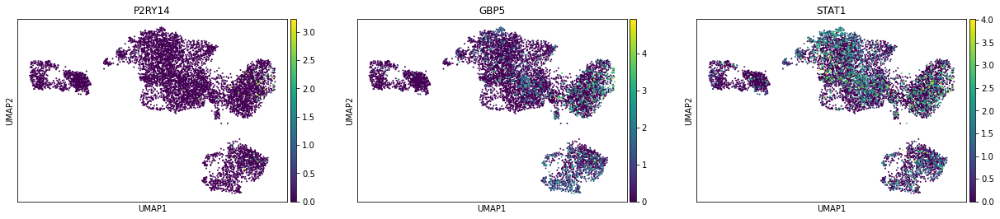

In [23]:
sc.pl.umap(adata_pos, color=Artik_genes)

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


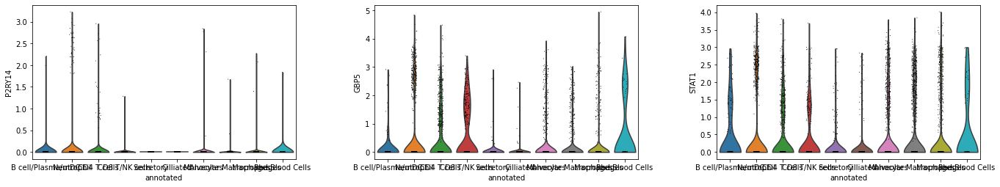

In [24]:
sc.pl.violin(adata_pos, Artik_genes, groupby='annotated')

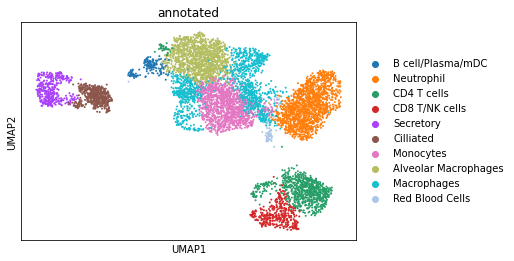

In [8]:
sc.pl.umap(adata_pos, color='annotated',save='Artik_COVID_Refined_UMAP_original.pdf' )

In [198]:
#My manual annnotation to Artik data based upon BALF resolution with filtering of 500 counts and min 300 genes and positive cases only

adata_pos.obs['annotated'] = adata_pos.obs['leiden_r1'].cat.add_categories(['B cell/Plasma/mDC','Neutrophil','Proliferating T cells','CD4 T cells','CD8 T/NK cells','Secretory','Cilliated','Monocytes','Alveolar Macrophages','Macrophages','Red Blood Cells'])
adata_pos.obs['annotated'][np.in1d(adata_pos.obs['annotated'], ['11'])] = 'B cell/Plasma/mDC'
adata_pos.obs['annotated'][np.in1d(adata_pos.obs['annotated'], ['0'])] = 'Neutrophil'
#adata_pos.obs['annotated'][np.in1d(adata_pos.obs['annotated'], ['12'])] = 'Proliferating T cells'
adata_pos.obs['annotated'][np.in1d(adata_pos.obs['annotated'], ['3','12'])] = 'CD4 T cells'
adata_pos.obs['annotated'][np.in1d(adata_pos.obs['annotated'], ['8'])] = 'CD8 T/NK cells'
adata_pos.obs['annotated'][np.in1d(adata_pos.obs['annotated'], ['7'])] = 'Secretory'
adata_pos.obs['annotated'][np.in1d(adata_pos.obs['annotated'], ['4'])] = 'Cilliated'
adata_pos.obs['annotated'][np.in1d(adata_pos.obs['annotated'], ['2'])] = 'Monocytes'
adata_pos.obs['annotated'][np.in1d(adata_pos.obs['annotated'], ['1'])] = 'Alveolar Macrophages'
adata_pos.obs['annotated'][np.in1d(adata_pos.obs['annotated'], ['5','6','9','10'])] = 'Macrophages'
adata_pos.obs['annotated'][np.in1d(adata_pos.obs['annotated'], ['13'])] = 'Red Blood Cells'


adata_pos.obs['annotated'] = adata_pos.obs['annotated'].cat.remove_unused_categories()


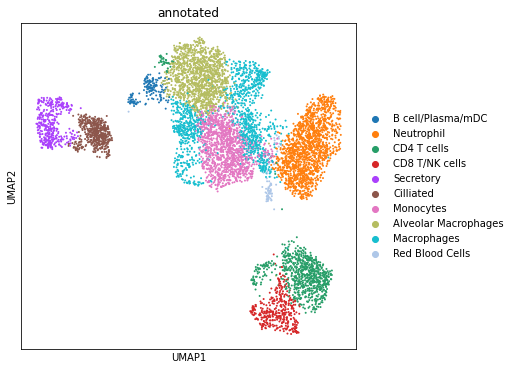

In [237]:
sc.pl.umap(adata_pos, color='annotated')

In [407]:
adata_pos.uns['annotated_colors']=['#c70039','#44103c','#31688eff','#ee7b06','#c2c5cc','#b01030','#008080','#ff0066','#111e6c','#f66d7a']

In [399]:
adata_pos.uns['annotated_colors']

['#c70039',
 '#44103c',
 '#31688eff',
 '#111e6c',
 '#c2c5cc',
 '#b01030',
 '#008080',
 '#ff0066',
 '#111e6c',
 '#f66d7a']

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


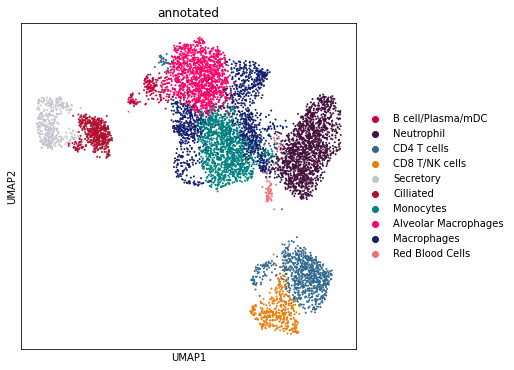

In [409]:
sc.pl.umap(adata_pos, color='annotated', save='Artike_UMAP_Pos_Refined.pdf')

In [ ]:
adata_merge.uns['annotated_colors']=['#c70039','#44103c','#31688eff','#f66d7a','#002625','#111e6c','#c2c5cc','#fde725ff','#ee7b06','#ff0066','#008080']
#dark pink(RedBloodCells), dark purple(Neutrophils), teal(mDC),coral pink(Cilliated),dark green(Secretory),slate blue(Tcells),black(monocytes),yellow(macrophages)
# 44103c, ff0066 (pink), 445c7a (dark grey)
#'#c2c5cc','#b01030'
#want Neutrophils (dark purple), Macrohages (yellow)

In [192]:
#My manual annnotation to Artik data based upon BALF ucsc resolution with filtering of 500 counts and min 300 genes and positive cases only

adata_pos.obs['annotated_ucsc'] = adata_pos.obs['leiden_r1'].cat.add_categories(['B cell/Plasma/mDC','Neutrophil','NK/T cells','Epithelial','Macrophages','Mast/Basophils','Red Blood Cells','Dividing Cells'])
adata_pos.obs['annotated_ucsc'][np.in1d(adata_pos.obs['annotated_ucsc'], ['11'])] = 'B cell/Plasma/mDC'
adata_pos.obs['annotated_ucsc'][np.in1d(adata_pos.obs['annotated_ucsc'], ['0'])] = 'Neutrophil'
#adata_pos.obs['annotated_ucsc'][np.in1d(adata_pos.obs['annotated_ucsc'], ['12'])] = 'Proliferating T cells'
adata_pos.obs['annotated_ucsc'][np.in1d(adata_pos.obs['annotated_ucsc'], ['8','3','12'])] = 'NK/T cells'
adata_pos.obs['annotated_ucsc'][np.in1d(adata_pos.obs['annotated_ucsc'], ['7','4'])] = 'Epithelial'
adata_pos.obs['annotated_ucsc'][np.in1d(adata_pos.obs['annotated_ucsc'], ['1','2','5','6','9','10'])] = 'Macrophages'
adata_pos.obs['annotated_ucsc'][np.in1d(adata_pos.obs['annotated_ucsc'], ['13'])] = 'Red Blood Cells'


adata_pos.obs['annotated_ucsc'] = adata_pos.obs['annotated_ucsc'].cat.remove_unused_categories()


/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


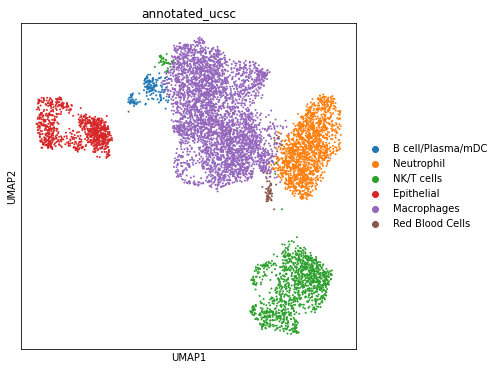

In [236]:
sc.pl.umap(adata_pos, color='annotated_ucsc')

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


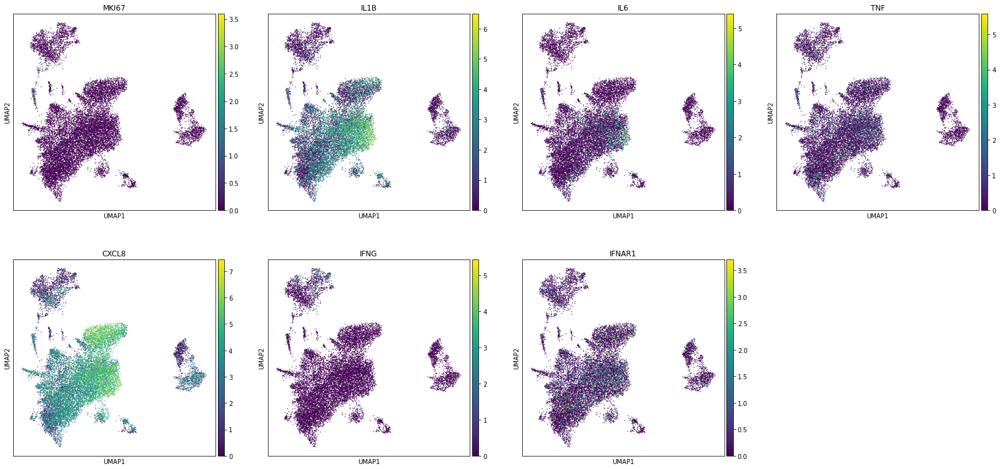

In [385]:
sc.pl.umap(adata_merge, color=['MKI67','IL1B','IL6','TNF','CXCL8','IFNG','IFNAR1'])